# Imports

In [ ]:
# Common Libraries needed
import requests #  2.27.1
import pandas as pd # 1.5.3
import numpy as np #1.22.4
import seaborn as sns #0.12.2
import matplotlib.pyplot as plt #3.7.1
import json
import time
import random
from datetime import timedelta

from io import StringIO
from pandas import json_normalize
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder

import textwrap

from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# hawaii and alaska and many other islands close to Philippines are dropped due to the fact hey are either too far from the continent
state_code_map = {
  "AL": "ALABAMA",
  "AR": "ARKANSAS",
  "AZ": "ARIZONA",
  "CA": "CALIFORNIA",
  "CO": "COLORADO",
  "CT": "CONNECTICUT",
  "DC": "DISTRICTOFCOLUMBIA",
  "DE": "DELAWARE",
  "FL": "FLORIDA",
  "GA": "GEORGIA",
  "IA": "IOWA",
  "ID": "IDAHO",
  "IL": "ILLINOIS",
  "IN": "INDIANA",
  "KS": "KANSAS",
  "KY": "KENTUCKY",
  "LA": "LOUISIANA",
  "MA": "MASSACHUSETTS",
  "MD": "MARYLAND",
  "ME": "MAINE",
  "MI": "MICHIGAN",
  "MN": "MINNESOTA",
  "MO": "MISSOURI",
  "MS": "MISSISSIPPI",
  "MT": "MONTANA",
  "NC": "NORTHCAROLINA",
  "ND": "NORTHDAKOTA",
  "NE": "NEBRASKA",
  "NH": "NEWHAMPSHIRE",
  "NJ": "NEWJERSEY",
  "NM": "NEWMEXICO",
  "NV": "NEVADA",
  "NY": "NEWYORK",
  "OH": "OHIO",
  "OK": "OKLAHOMA",
  "OR": "OREGON",
  "PA": "PENNSYLVANIA",
  "RI": "RHODEISLAND",
  "SC": "SOUTHCAROLINA",
  "SD": "SOUTHDAKOTA",
  "TN": "TENNESSEE",
  "TX": "TEXAS",
  "UT": "UTAH",
  "VA": "VIRGINIA",
  "VT": "VERMONT",
  "WA": "WASHINGTON",
  "WI": "WISCONSIN",
  "WV": "WESTVIRGINIA",
  "WY": "WYOMING",
}
noaa_token = ["xwLtWwHdjocVgepGzqsdzlvEhpnjjmwF", "NXyYAVssxowLdjVuJdFdTQiJVRIAliNe", "hTpoItnfeJjzUttdXdvUjmIPbPtQvomp", "KWlICgcfRMrdeUALoEmPqtduiUBCrTSH",
              "LuCzLKgNkdTXqCGzTGHKTQnlGYcLcFrB", "RPutrOUrsxMLsuPKQTIsvQhvQCuagRDS", "pvzWEtkOFvzuFcKSVRHmAwgKNVlevVpC", "PagYmbMzIDvjeynIFeXWCjjfwZDvgOoN",
              "ZkQhvNIHZoPSqDQYGvKqJgcWDtyJZtpN", "rBYjKdTwLemuWEstFOkTljEjgeJusWVw"]
token_counter_n = -1

def get_GHCND_station_map():
    global station_map
    if station_map is not None:
        return station_map
    urll = "https://www.ncei.noaa.gov/pub/data/ghcn/daily/ghcnd-stations.txt"
    dat = requests.get(urll)
    dat = dat.text.split("\n")
    state_map = dict()
    for line in dat:
        state = line[38:40]
        if state == "  " or len(state) != 2:
            continue
        if state not in state_code_map:
            continue
        if state in state_map:
            state_map[state].append(line[:12].strip())
        else:
            state_map[state] = [line[:12].strip()]
        
    for state in state_map:
        state_map[state] = random.sample(state_map[state], k=min(len(state_map[state]), 75))
    station_map = state_map
    return station_map

def get_token(next=False):
    global token_counter_n, noaa_token
    if next:
      print("New counter {}".format(token_counter_n))
      token_counter_n =  (token_counter_n + 1) % len(noaa_token)
    return noaa_token[token_counter_n]


In [ ]:
# Save station_map
with open("/content/drive/My Drive/IS4242 Group 3/data/station_map.txt", "w") as fil:
  fil.write(json.dumps(station_map))
  

In [ ]:
# Load station_map
with open("/content/drive/My Drive/IS4242 Group 3/data/station_map.txt", "r") as fil:
  station_map = json.loads(fil.read())

for s in station_map:
  if len(station_map[s]) != 75:
    print(s)
    print(station_map[s])


# 1.0 API Sources

### 1.1 API Source for Temperature, Humidity, Rainfall, Wind Speed

In [ ]:
# Obtain the station ID. Includes non-us stations.
def get_temp_data(us_states_list, start_dt, end_dt):
    token = get_token()
    state_map = get_GHCND_station_map()
    start_str = start_dt if isinstance(start_dt, str) else start_dt.strftime("%Y-%m-%d")
    end_str = end_dt if isinstance(end_dt, str) else end_dt.strftime("%Y-%m-%d")
    result_val = None
    for state, stations in state_map.items():
        print("Collecting data for state:", state)
        if state not in us_states_list:
            continue
        for station in stations:
            TAVG = "https://www.ncdc.noaa.gov/cdo-web/api/v2/data?datasetid=GHCND&datatypeid=TAVG&limit=1000&stationid=GHCND:{}&startdate={}&enddate={}&units=metric".format(station, start_str, end_str)
            while True:
                try:
                    req = requests.get(TAVG, headers={"token": token})
                    reply = req.json()
                    if "status" in reply:
                      print("status reply, msg: " + reply["status"] + ", " + reply["message"])
                      if reply["status"] == "429":
                        token = get_token(next=True)
                      continue
                    break
                except:
                    print("unable to get station data for ", station,", trying again!")
                time.sleep(0.2)
            if "results" in reply and len(reply["results"]) > 1:
                data = reply["results"]
            else:
                if len(reply) > 0:
                  print("reply: ", reply)
                continue
            new_df = pd.DataFrame(data)
            new_df["state"] = state
            if result_val is not None:
                result_val = pd.concat([result_val, new_df], ignore_index=True)
            else:
                result_val = new_df
    if result_val is None: 
      print("result_val is None")
      return None
    a = result_val[["datatype", "state", "date", "value"]].groupby(by=["state", "date", "datatype"]).mean().reset_index()
    a.to_csv("/content/drive/My Drive/IS4242 Group 3/data/temp_data.csv", index=False, mode="a")
    return a




print("\ncollecting data for 2019")
df = get_temp_data([state for state in state_code_map], "2019-01-01", "2019-12-31")

for year in range(2018, 2017, -1):
    print("\n\ncollected data for ", year)
    df = pd.concat([df ,get_temp_data([state for state in state_code_map], str(year) + "-01-01", str(year) + "-12-31")])



In [ ]:
# convert data into monthly
temp_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/temp_data.csv", sep=",")
temp_df = temp_df.drop(temp_df[temp_df["state"] == "state"].index)
temp_df["value"] = pd.to_numeric(temp_df["value"])

temp_df["date"] = pd.to_datetime(temp_df["date"], format="%Y-%m-%dT%H:%M:%S")
print(temp_df.dtypes)

temp_df["month"] = temp_df["date"].dt.strftime('%m')
temp_df["year"] = temp_df["date"].dt.strftime('%Y')

temp_df = temp_df[["value", "state", "month", "year"]].groupby(by=["state", "month", "year"]).mean().reset_index()
temp_df["date"] = pd.to_datetime(temp_df["year"]+ "-" + temp_df["month"] + "-01")
temp_df = temp_df.drop(["month", "year"], axis=1)
temp_df.to_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_temp_data.csv", index=False)
temp_df.head()

In [ ]:
monthly_temp_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_temp_data.csv", sep=",")
monthly_temp_df.head()

In [ ]:
# API for getting Average Wind Speed
def get_wind_speed_data(us_states_list, start_dt, end_dt):
    # Max range for API call is one year
    # Data points are daily, Units is in meters per second
    token = "xwLtWwHdjocVgepGzqsdzlvEhpnjjmwF"
    state_map = get_GHCND_station_map()
    start_str = start_dt if isinstance(start_dt, str) else start_dt.strftime("%Y-%m-%d")
    end_str = end_dt if isinstance(end_dt, str) else end_dt.strftime("%Y-%m-%d")
    result_val = None
    for state, stations in state_map.items():
        if state not in us_states_list:
            continue
        print("Collecting data for state:", state)
        for station in stations:
            AWND = "https://www.ncdc.noaa.gov/cdo-web/api/v2/data?datasetid=GHCND&datatypeid=AWND&limit=1000&stationid=GHCND:{}&startdate={}&enddate={}&units=metric".format(station, start_str, end_str)
            while True:
                try:
                    req = requests.get(AWND, headers={"token": token})
                    reply = req.json()
                    if "status" in reply:
                      print("status reply, msg:<{}>,<>".format(reply["status"], reply["message"]))
                      if reply["status"] == "429":
                        token = get_token(next=True)
                        print("using new token: {}".format(token))
                      continue
                    break
                except:
                    print("unable to get station data for ", station,", trying again!")
                time.sleep(0.2)
            if "results" in reply and len(reply["results"]) > 1:
                data = reply["results"]
            else:
                if len(reply) > 0:
                  print("reply: ", reply)
                continue
            new_df = pd.DataFrame(data)
            new_df["state"] = state
            if result_val is not None:
                result_val = pd.concat([result_val, new_df], ignore_index=True)
            else:
                result_val = new_df
    if result_val is None: 
      print("result_val is None")
      return None
    a = result_val[["datatype", "state", "date", "value"]].groupby(by=["state", "date", "datatype"]).mean().reset_index()
    a.to_csv("/content/drive/My Drive/IS4242 Group 3/data/wind_speed_data.csv", index=False, mode="a")
    return a

print("\ncollecting data for 2019")
df = get_wind_speed_data([state for state in state_code_map], "2019-01-01", "2019-12-31")

for year in range(2018, 2017, -1):
    print("\n\ncollected data for ", year)
    df = pd.concat([df ,get_wind_speed_data([state for state in state_code_map], str(year) + "-01-01", str(year) + "-12-31")])


In [ ]:
# convert data into monthly
wind_speed_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/wind_speed_data.csv", sep=",")
wind_speed_df = wind_speed_df.drop(wind_speed_df[wind_speed_df["state"] == "state"].index)
wind_speed_df["value"] = pd.to_numeric(wind_speed_df["value"])

wind_speed_df["date"] = pd.to_datetime(wind_speed_df["date"], format="%Y-%m-%dT%H:%M:%S")
print(wind_speed_df.dtypes)

wind_speed_df["month"] = wind_speed_df["date"].dt.strftime('%m')
wind_speed_df["year"] = wind_speed_df["date"].dt.strftime('%Y')

wind_speed_df = wind_speed_df[["value", "state", "month", "year"]].groupby(by=["state", "month", "year"]).mean().reset_index()
wind_speed_df["date"] = pd.to_datetime(wind_speed_df["year"]+ "-" + wind_speed_df["month"] + "-01")
wind_speed_df = wind_speed_df.drop(["month", "year"], axis=1)
wind_speed_df.to_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_wind_speed_data.csv", index=False)
wind_speed_df.head()

In [ ]:
monthly_wind_speed_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_wind_speed_data.csv", sep=",")
monthly_wind_speed_df.head()

In [ ]:
# API for getting Precipitation
def get_precipitation_data(us_states_list, start_dt, end_dt):
    # Max range for API call is one year
    # Data points are daily, Units is in meters per second
    token = "xwLtWwHdjocVgepGzqsdzlvEhpnjjmwF"
    state_map = get_GHCND_station_map()
    start_str = start_dt if isinstance(start_dt, str) else start_dt.strftime("%Y-%m-%d")
    end_str = end_dt if isinstance(end_dt, str) else end_dt.strftime("%Y-%m-%d")
    result_val = None
    for state, stations in state_map.items():
        if state not in us_states_list:
            continue
        print("Collecting data for state:", state)
        for station in stations:
            PRCP = "https://www.ncdc.noaa.gov/cdo-web/api/v2/data?datasetid=GHCND&datatypeid=PRCP&limit=1000&stationid=GHCND:{}&startdate={}&enddate={}&units=metric".format(station, start_str, end_str)
            while True:
                time.sleep(0.22)
                try:
                    req = requests.get(PRCP, headers={"token": token})
                    reply = req.json()
                    if "status" in reply:
                      print("status reply, msg: " + reply["status"] + ", " + reply["message"])
                      if reply["status"] == "429":
                        token = get_token(next=True)
                      continue
                    break
                except:
                    print("reply:", req.text)
                    print("unable to get station data for ", station,", trying again!")
            if "results" in reply and len(reply["results"]) > 0:
                data = reply["results"]
            else:
                if len(reply) > 0:
                  print("reply: ", reply)
                continue
            new_df = pd.DataFrame(data)
            new_df["state"] = state
            if result_val is not None:
                result_val = pd.concat([result_val, new_df], ignore_index=True)
            else:
                result_val = new_df
    if result_val is None: 
      print("result_val is None")
      return None
    a = result_val[["datatype", "state", "date", "value"]].groupby(by=["state", "date", "datatype"]).mean().reset_index()
    a.to_csv("/content/drive/My Drive/IS4242 Group 3/data/precipitation_data.csv", index=False, mode="a")
    return a

print("\ncollecting data for year 2018")
df = get_precipitation_data([state for state in state_code_map], "2018-01-01", "2018-12-31")

# for year in range(2021, 2018, -1):
#     print("\n\ncollected data for year ", year)
#     df = pd.concat([df ,get_precipitation_data([state for state in state_code_map], str(year) + "-01-01", str(year) + "-12-31")])


In [ ]:
# convert data into monthly
precipitation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/precipitation_data.csv", sep=",")
precipitation_df = precipitation_df.drop(precipitation_df[precipitation_df["state"] == "state"].index)
precipitation_df["value"] = pd.to_numeric(precipitation_df["value"])

precipitation_df["date"] = pd.to_datetime(precipitation_df["date"], format="%Y-%m-%dT%H:%M:%S")
print(precipitation_df.dtypes)

precipitation_df["month"] = precipitation_df["date"].dt.strftime('%m')
precipitation_df["year"] = precipitation_df["date"].dt.strftime('%Y')

precipitation_df = precipitation_df[["value", "state", "month", "year"]].groupby(by=["state", "month", "year"]).mean().reset_index()
precipitation_df["date"] = pd.to_datetime(precipitation_df["year"]+ "-" + precipitation_df["month"] + "-01")
precipitation_df = precipitation_df.drop(["month", "year"], axis=1)
precipitation_df.to_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_precipitation_data.csv", index=False)
precipitation_df.head()

In [ ]:
monthly_precipitation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_precipitation_data.csv", sep=",")
monthly_precipitation_df.head()

,state,value,date
0,AL,1.747209,2018-01-01
1,AL,5.059876,2019-01-01
2,AL,6.205107,2020-01-01
3,AL,3.046954,2021-01-01
4,AL,4.077585,2022-01-01


In [ ]:
# API for getting average evaporation
def get_evaporation_data(us_states_list, start_dt, end_dt):
    # Max range for API call is one year
    # Data points are daily, Units is in millimeters (mm)
    token = "xwLtWwHdjocVgepGzqsdzlvEhpnjjmwF"
    state_map = get_GHCND_station_map()
    start_str = start_dt if isinstance(start_dt, str) else start_dt.strftime("%Y-%m-%d")
    end_str = end_dt if isinstance(end_dt, str) else end_dt.strftime("%Y-%m-%d")
    result_val = None
    for state, stations in state_map.items():
        if state not in us_states_list:
            continue
        print("Collecting data for state:", state)
        for station in stations:
            EVAP = "https://www.ncdc.noaa.gov/cdo-web/api/v2/data?datasetid=GHCND&datatypeid=EVAP&limit=1000&stationid=GHCND:{}&startdate={}&enddate={}&units=metric".format(station, start_str, end_str)
            while True:
                time.sleep(0.22)
                try:
                    req = requests.get(EVAP, headers={"token": token})
                    reply = req.json()
                    if "status" in reply:
                      print("status reply, msg: " + reply["status"] + ", " + reply["message"])
                      if reply["status"] == "429":
                        token = get_token(next=True)
                      continue
                    break
                except:
                    if "503 Service Unavailable" not in req.text:
                      print("reply:", req.text)
                    print("unable to get station data for ", station,", trying again!")
            if "results" in reply and len(reply["results"]) > 0:
                data = reply["results"]
            else:
                if len(reply) > 0:
                  print("reply: ", reply)
                continue
            new_df = pd.DataFrame(data)
            new_df["state"] = state
            if result_val is not None:
                result_val = pd.concat([result_val, new_df], ignore_index=True)
            else:
                result_val = new_df
    if result_val is None: 
      print("result_val is None")
      return None
    a = result_val[["datatype", "state", "date", "value"]].groupby(by=["state", "date", "datatype"]).mean().reset_index()
    a.to_csv("/content/drive/My Drive/IS4242 Group 3/data/evaporation_data.csv", index=False, mode="a")
    return a

print("\ncollecting data for 2022")
df = get_evaporation_data([state for state in state_code_map], "2022-01-01", "2022-12-31")

for year in range(2021, 2017, -1):
    print("\n\ncollected data for ", year)
    df = pd.concat([df ,get_evaporation_data([state for state in state_code_map], str(year) + "-01-01", str(year) + "-12-31")])


In [ ]:
# convert data into monthly
evaporation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/evaporation_data.csv", sep=",")
evaporation_df = evaporation_df.drop(evaporation_df[evaporation_df["state"] == "state"].index)
evaporation_df["value"] = pd.to_numeric(evaporation_df["value"])

evaporation_df["date"] = pd.to_datetime(evaporation_df["date"], format="%Y-%m-%dT%H:%M:%S")
print(evaporation_df.dtypes)

evaporation_df["month"] = evaporation_df["date"].dt.strftime('%m')
evaporation_df["year"] = evaporation_df["date"].dt.strftime('%Y')

evaporation_df = evaporation_df[["value", "state", "month", "year"]].groupby(by=["state", "month", "year"]).mean().reset_index()
evaporation_df["date"] = pd.to_datetime(evaporation_df["year"]+ "-" + evaporation_df["month"] + "-01")
evaporation_df = evaporation_df.drop(["month", "year"], axis=1)
evaporation_df.to_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_evaporation_data.csv", index=False)
evaporation_df.head()

In [ ]:
monthly_evaporation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_evaporation_data.csv", sep=",")
monthly_evaporation_df.head()

### 1.2 API Source for Natural Disaster

In [ ]:
# response = requests.get(f"https://www.fema.gov/api/open/v2/DisasterDeclarationsSummaries?$format=csv")
# text = StringIO(response.content.decode('utf-8'))
# disaster_data = pd.read_csv(text)
# disaster_data

disaster = pd.read_csv('/content/drive/My Drive/IS4242 Group 3/data/DisasterDeclarationsSummaries.csv')
disaster

In [ ]:
print(disaster.shape)
# Convert start end date into monthly rows. IE from 01-01 to 01-12 into [01-01, 01-02, ... 01-12]
disaster_df = pd.DataFrame({
    "incidentType":[],
    "declarationType":[],
    "femaDeclarationString":[],
    "declarationTitle":[],
    "state":[],
    "date":[],
    "fipsCountyCode":[],
    "fipsStateCode":[],
    "placeCode":[],
    "designatedArea":[],
    "paProgramDeclared":[],
    "iaProgramDeclared":[],
    "ihProgramDeclared":[],
})
for index, row in disaster.iterrows():
  if pd.isna(row["incidentBeginDate"]):
    print("row {} incidentBeginDate is nan".format(index))
  start = pd.to_datetime(row["incidentBeginDate"])
  start = pd.to_datetime("{}-{}-01".format(start.year, start.month))
  end = pd.to_datetime(row["incidentEndDate"])
  if pd.isna(row["incidentEndDate"]):
    end = start
  end = pd.to_datetime("{}-{}-01".format(end.year, end.month))
  while start <= end:
    new_row = pd.DataFrame({
      "incidentType":row["incidentType"],
      "declarationType":row["declarationType"],
      "state":row["state"],
      "date": pd.to_datetime("{}-{}-01".format(start.year, start.month)),
      "paProgramDeclared":row["paProgramDeclared"],
      "iaProgramDeclared":row["iaProgramDeclared"],
      "ihProgramDeclared":row["ihProgramDeclared"],
      "femaDeclarationString":row["femaDeclarationString"],
      "declarationTitle":row["declarationTitle"],
      "fipsCountyCode":row["fipsCountyCode"],
      "placeCode":row["placeCode"],
      "designatedArea":row["designatedArea"]
    }, index=[0])
    disaster_df = pd.concat([disaster_df, new_row], ignore_index=True)
    next_month = start.month + 1
    next_year = start.year
    if next_month > 12:
      next_month = 1
      next_year += 1
    start = pd.to_datetime("{}-{}-01".format(next_year, next_month))

print(disaster_df.shape)
disaster_df.to_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_disaster.csv", index=False)
disaster_df.head()


In [ ]:
disaster_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_disaster.csv")
disaster_df

,incidentType,declarationType,femaDeclarationString,declarationTitle,state,date,fipsCountyCode,fipsStateCode,placeCode,designatedArea,paProgramDeclared,iaProgramDeclared,ihProgramDeclared
0,Fire,FM,FM-5457-OR,CEDAR CREEK FIRE,OR,2022-09-01,39.0,NaN,99039.0,Lane (County),1.0,0.0,0.0
1,Fire,FM,FM-5456-WA,NAKIA CREEK FIRE,WA,2022-10-01,11.0,NaN,99011.0,Clark (County),1.0,0.0,0.0
2,Fire,FM,FM-5456-WA,NAKIA CREEK FIRE,WA,2022-10-01,59.0,NaN,99059.0,Skamania (County),1.0,0.0,0.0
3,Fire,FM,FM-5455-WA,BOLT CREEK FIRE,WA,2022-09-01,33.0,NaN,99033.0,King (County),1.0,0.0,0.0
4,Fire,FM,FM-5455-WA,BOLT CREEK FIRE,WA,2022-09-01,61.0,NaN,99061.0,Snohomish (County),1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
107717,Hurricane,DR,DR-44-SC,HURRICANES,SC,1955-08-01,0.0,NaN,0.0,Statewide,1.0,1.0,0.0
107718,Hurricane,DR,DR-43-MA,HURRICANE & FLOODS,MA,1955-08-01,0.0,NaN,0.0,Statewide,1.0,1.0,0.0
107719,Hurricane,DR,DR-42-CT,"HURRICANE, TORRENTIAL RAIN & FLOODS",CT,1955-08-01,0.0,NaN,0.0,Statewide,1.0,1.0,0.0
107720,Hurricane,DR,DR-41-NJ,HURRICANE & FLOODS,NJ,1955-08-01,0.0,NaN,0.0,Statewide,1.0,1.0,0.0


In [ ]:
print(disaster_df['state'].unique())
# print(disaster_df['fipsStateCode'].unique())
# print(disaster_df['incidentBeginDate'].unique())
print(disaster_df['incidentType'].unique())

['OR' 'WA' 'CA' 'ID' 'NV' 'TX' 'AK' 'AZ' 'NM' 'NE' 'FL' 'KS' 'CO' 'OK'
 'SD' 'UT' 'MT' 'HI' 'WY' 'GA' 'TN' 'KY' 'NC' 'SC' 'NH' 'NY' 'ND' 'AL'
 'WV' 'IL' 'VA' 'PR' 'AS' 'MN' 'MO' 'RI' 'MA' 'ME' 'IA' 'AR' 'CT' 'DE'
 'MS' 'VT' 'PA' 'NJ' 'LA' 'MI' 'MD' 'WI' 'IN' 'VI' 'MP' 'OH' 'DC' 'GU'
 'FM' 'MH' 'PW']
['Fire' 'Snowstorm' 'Severe Storm' 'Earthquake' 'Winter Storm' 'Flood'
 'Hurricane' 'Mud/Landslide' 'Coastal Storm' 'Tornado' 'Other'
 'Severe Ice Storm' 'Biological' 'Dam/Levee Break' 'Typhoon'
 'Volcanic Eruption' 'Freezing' 'Tropical Storm' 'Toxic Substances'
 'Chemical' 'Terrorist' 'Drought' 'Human Cause' 'Fishing Losses' 'Tsunami']


### 1.3 API Source for Electricity Price

In [ ]:
import requests
import pandas as pd


# -----  Query data from API

# 50 states + District of columbia
states = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO',
          'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']

# Encoding of parameters, specific for EIA APIv2
def flatten_dict(d, parent_key=''):
    items = []
    for key, value in d.items():
        new_key = f'{parent_key}[{key}]' if parent_key else key
        if isinstance(value, dict):
            items.extend(flatten_dict(value, new_key).items())
        elif isinstance(value, list):
            for i, item in enumerate(value):
                if isinstance(item, (dict, list)):
                    items.extend(flatten_dict(item, f'{new_key}[{i}]').items())
                else:
                    items.append((f'{new_key}[{i}]', item))
        else:
            items.append((new_key, value))
    return dict(items)

# API endpoint URL
url = 'https://api.eia.gov/v2/electricity/retail-sales/data/'

# API request parameters
params = {
    'frequency': 'monthly',
    'data': [
        'customers',
        'price',
        'revenue',
        'sales'
    ],
    'facets': {
        'sectorid': ['ALL'],
        'stateid': states,
    },
    'start': '2000-01',
    'end': '2022-12',
    'sort': [
        {
            'column': 'period',
            'direction': 'asc'
        }
    ],
    'offset': 0,    # this will vary to query all data
    'length': 0,    # max length is 5000
    'api_key': 'GtabvEXVce8TGs0abDAXrzkVIZskzvaryDL97r2g',
}
maxLength = 5000

# Send GET request to API
response_raw = requests.get(url, params=flatten_dict(params))
response = response_raw.json()['response']

# Total number of requests needed
total_rows = response['total']
import math
total_requests = math.ceil(total_rows/maxLength)

# Sequentially query all data
data = list()
max_offset = total_requests*maxLength
for new_offset in range(0, total_requests*maxLength, maxLength):
    new_params = params
    new_params['offset'] = new_offset
    new_params['length'] = maxLength

    # Send GET request
    response_raw = requests.get(url, params=flatten_dict(new_params))
    new_data = response_raw.json()['response']['data']
    data.extend(new_data)

    print(f'Offset {new_offset}/{max_offset} done!')


# -----  Process data

df = pd.DataFrame.from_dict(data)
df

# Remove unecessary columns
df.drop(labels=['sectorid', 'sectorName', 'stateDescription', 'customers-units', 'price-units', 'revenue-units', 'sales-units'], axis=1, inplace=True)

# Rename columns
df.rename(columns={'period': 'date', 'stateid': 'state', 'customers': 'customers_elec', 'price': 'price_elec', 'revenue': 'revenue_elec', 'sales': 'sales_elec'}, inplace=True)

# Save data into csv
df.to_csv('/content/drive/My Drive/IS4242 Group 3/data/electricity_data.csv', index=False)

### 1.4 API Source for Electricity Usage (Monthly)

In [ ]:
import requests
import pandas as pd


# -----  Query data from API

# 50 states + District of columbia
states = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO',
          'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']

# Encoding of parameters, specific for EIA APIv2
def flatten_dict(d, parent_key=''):
    items = []
    for key, value in d.items():
        new_key = f'{parent_key}[{key}]' if parent_key else key
        if isinstance(value, dict):
            items.extend(flatten_dict(value, new_key).items())
        elif isinstance(value, list):
            for i, item in enumerate(value):
                if isinstance(item, (dict, list)):
                    items.extend(flatten_dict(item, f'{new_key}[{i}]').items())
                else:
                    items.append((f'{new_key}[{i}]', item))
        else:
            items.append((new_key, value))
    return dict(items)

# API endpoint URL
url = 'https://api.eia.gov/v2/electricity/electric-power-operational-data/data/'

# API request parameters
params = {
    'frequency': 'monthly',
    'data': [
        'consumption-for-eg',
        'consumption-for-eg-btu',
        'consumption-uto',
        'consumption-uto-btu',
        'generation',
        'total-consumption',
        'total-consumption-btu'
    ],
    'facets': {
        'location': states,
        'sectorid': [99],  # all sectors
        'fueltypeid': ['ALL']
    },
    'start': '2001-01',
    'end': '2022-12',
    'sort': [
        {
            'column': 'period',
            'direction': 'asc'
        }
    ],
    'offset': 0,    # this will vary to query all data
    'length': 0,    # max length is 5000
    'api_key': 'GtabvEXVce8TGs0abDAXrzkVIZskzvaryDL97r2g',
}
maxLength = 5000

# Send GET request to API
response_raw = requests.get(url, params=flatten_dict(params))
response = response_raw.json()['response']

# Total number of requests needed
total_rows = response['total']
import math
total_requests = math.ceil(total_rows/maxLength)

# Sequentially query all data
data = list()
max_offset = total_requests*maxLength
for new_offset in range(0, total_requests*maxLength, maxLength):
    new_params = params
    new_params['offset'] = new_offset
    new_params['length'] = maxLength

    # Send GET request
    response_raw = requests.get(url, params=flatten_dict(new_params))
    new_data = response_raw.json()['response']['data']
    data.extend(new_data)

    print(f'Offset {new_offset}/{max_offset} done!')


# -----  Process data

df = pd.DataFrame.from_dict(data)
df

# Remove unecessary columns
df.drop(labels=['sectorid', 'sectorDescription', 'stateDescription', 'fueltypeid', 'fuelTypeDescription', 'consumption-for-eg-units', 'consumption-for-eg-btu-units', 'consumption-uto-units', 'consumption-uto-btu-units', 'generation-units', 'total-consumption-units', 'total-consumption-btu-units'], axis=1, inplace=True)

# Rename columns
df.rename(columns={'period': 'date', 'location': 'state'}, inplace=True)

# Save data into csv
df.to_csv('/content/drive/My Drive/IS4242 Group 3/data/electricity_usage.csv', index=False)

### 1.5 API Source for Transportation Statistics 

In [ ]:
import requests
import pandas as pd

df = pd.read_csv('Trips_by_Distance.csv')
df

# Drop rows where column 'Level' contains is 'National' or 'County'
df = df[~(df['Level'] == ('National' or 'County'))]

# Remove unecessary columns
df.drop(labels=['Level', 'State FIPS', 'County FIPS', 'County Name', 'Row ID', 'Week', 'Month'], axis=1, inplace=True)

# Rename columns
df.rename(columns={
    'Date': 'date',
    'State Postal Code': 'state',
    'Population Staying at Home': 'trips_pop_at_home',
    'Population Not Staying at Home': 'trips_pop_not_at_home',
    'Number of Trips': 'trips_n_total',
    'Number of Trips <1': 'trips_n_lt_1',
    'Number of Trips 1-3': 'trips_n_1_3',
    'Number of Trips 3-5': 'trips_n_3_5',
    'Number of Trips 5-10': 'trips_n_5_10',
    'Number of Trips 10-25': 'trips_n_10_25',
    'Number of Trips 25-50': 'trips_n_25_50',
    'Number of Trips 100-250': 'trips_n_100_250',
    'Number of Trips 250-500': 'trips_n_250_500',
    'Number of Trips >=500': 'trips_n_gt_500',
    }, inplace=True)

# Modify data column to include only year and month
df['date'] = pd.to_datetime(df['date']).dt.to_period('M')

# Group all data pertaining to the same month for the same state: mean
df = df.groupby(['date', 'state']).mean().reset_index()

df.to_csv('/content/drive/My Drive/IS4242 Group 3/data/transportation_data.csv', index=False)

### 1.6 API Source for Crude Oil Prices (West Texas Intermediate)

In [ ]:
import requests
import pandas as pd


# ----- Query data from API

# 50 states + District of columbia
states = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO',
          'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']

# API endpoint URL
url = 'https://data.nasdaq.com/api/v3/datasets/FRED/DCOILWTICO.json'

# API request parameters
params = {
    'api_key': 'wHJrgYHxo8E9Umv_cEGy',
}

# Send GET request to API
response_raw = requests.get(url, params=params)

# Extract data
data = response_raw.json()['dataset']['data']


# ----- Process data

df = pd.DataFrame.from_records(data)
df

# Rename columns
df.rename(columns={0: 'date', 1:'price_wti'}, inplace=True)

# Drop values from before 2001
df['date'] = pd.to_datetime(df['date'])
df = df[df['date'] >= '2001-01-01']

# Group data pertaining to the same month; calculate average
df['date'] = df['date'].dt.to_period('M')
df = df.groupby('date').mean().reset_index()

# Add the state column
new_columns = df.columns.insert(1, 'state')

# Create a new dataframe containing the first element of the desired output combined with each row in the original dataframe
new_df = pd.concat([pd.DataFrame([[row[0], s] + list(row[1:])], columns=new_columns) for row in df.values for s in states], ignore_index=True)

# Save data into csv
new_df.to_csv('/content/drive/My Drive/IS4242 Group 3/data/crude_oil_wti.csv', index=False)

### 1.7 API source of Economic data (industrial production index)

In [ ]:
import requests
import pandas as pd


# ----- Query data from API

# 50 states + District of columbia
states = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO',
          'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']

# API endpoint URL
url = 'https://data.nasdaq.com/api/v3/datasets/FRED/INDPRO.json'

# API request parameters
params = {
    'api_key': 'wHJrgYHxo8E9Umv_cEGy',
}

# Send GET request to API
response_raw = requests.get(url, params=params)

# Extract data
data = response_raw.json()['dataset']['data']


# ----- Process data

df = pd.DataFrame.from_records(data)
df

# Rename columns
df.rename(columns={0: 'date', 1:'index_ipi'}, inplace=True)

# Drop values from before 2001
df['date'] = pd.to_datetime(df['date'])
df = df[df['date'] >= '2001-01-01']

# Group data pertaining to the same month; calculate average
df['date'] = df['date'].dt.to_period('M')
df = df.groupby('date').mean().reset_index()

# Add the state column
new_columns = df.columns.insert(1, 'state')

# Create a new dataframe containing the first element of the desired output combined with each row in the original dataframe
new_df = pd.concat([pd.DataFrame([[row[0], s] + list(row[1:])], columns=new_columns) for row in df.values for s in states], ignore_index=True)

# Save data into csv
new_df.to_csv('/content/drive/My Drive/IS4242 Group 3/data/industrial_production_index.csv', index=False)

# 2.0 Aggregate Data

In [ ]:
state_code_map = {
  "AL": "ALABAMA",  "AR": "ARKANSAS",  "AZ": "ARIZONA",  "CA": "CALIFORNIA",  "CO": "COLORADO",  "CT": "CONNECTICUT",  "DC": "DISTRICTOFCOLUMBIA",  "DE": "DELAWARE",  "FL": "FLORIDA",  "GA": "GEORGIA",  "IA": "IOWA",
  "ID": "IDAHO",  "IL": "ILLINOIS",  "IN": "INDIANA",  "KS": "KANSAS",  "KY": "KENTUCKY",  "LA": "LOUISIANA",  "MA": "MASSACHUSETTS",  "MD": "MARYLAND",  "ME": "MAINE",  "MI": "MICHIGAN",  "MN": "MINNESOTA",  "MO": "MISSOURI",
  "MS": "MISSISSIPPI",  "MT": "MONTANA",  "NC": "NORTHCAROLINA",  "ND": "NORTHDAKOTA",  "NE": "NEBRASKA",  "NH": "NEWHAMPSHIRE",  "NJ": "NEWJERSEY",  "NM": "NEWMEXICO",  "NV": "NEVADA",  "NY": "NEWYORK",  "OH": "OHIO",
  "OK": "OKLAHOMA",  "OR": "OREGON",  "PA": "PENNSYLVANIA",  "RI": "RHODEISLAND",  "SC": "SOUTHCAROLINA",  "SD": "SOUTHDAKOTA",  "TN": "TENNESSEE",  "TX": "TEXAS",  "UT": "UTAH",  "VA": "VIRGINIA",  "VT": "VERMONT",
  "WA": "WASHINGTON",  "WI": "WISCONSIN",  "WV": "WESTVIRGINIA",  "WY": "WYOMING"}
# Load in values
monthly_temp_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_temp_data.csv", sep=",")
monthly_wind_speed_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_wind_speed_data.csv", sep=",")
monthly_precipitation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_precipitation_data.csv", sep=",")
monthly_evaporation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_evaporation_data.csv", sep=",")
disaster_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/monthly_disaster.csv")
transportation_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/transportation_data.csv", sep=",")
electricity_usage_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/electricity_usage.csv", sep=",")
industrial_production_index_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/industrial_production_index.csv", sep=",")
crude_oil_df = pd.read_csv("/content/drive/My Drive/IS4242 Group 3/data/crude_oil_wti.csv", sep=",")

# Load data types
monthly_temp_df["date"] = pd.to_datetime(monthly_temp_df["date"])
monthly_wind_speed_df["date"] = pd.to_datetime(monthly_wind_speed_df["date"])
monthly_precipitation_df["date"] = pd.to_datetime(monthly_precipitation_df["date"])
monthly_evaporation_df["date"] = pd.to_datetime(monthly_evaporation_df["date"])
disaster_df["date"] = pd.to_datetime(disaster_df["date"])
transportation_df["date"] = pd.to_datetime(transportation_df["date"] + "-01")
electricity_usage_df["date"] = pd.to_datetime(electricity_usage_df["date"] + "-01")
industrial_production_index_df["date"] = pd.to_datetime(industrial_production_index_df["date"] + "-01")
crude_oil_df["date"] = pd.to_datetime(crude_oil_df["date"] + "-01")

# Remove data points before 2018 and states no in state_code_map
disaster_df = disaster_df[disaster_df["date"] >= pd.to_datetime("2018-01-01")]
transportation_df = transportation_df[transportation_df["state"].isin(list(state_code_map.keys()))]
electricity_usage_df = electricity_usage_df[electricity_usage_df["state"].isin(list(state_code_map.keys()))]
electricity_usage_df = electricity_usage_df[electricity_usage_df["date"] >= pd.to_datetime("2018-01-01")]
industrial_production_index_df = industrial_production_index_df[industrial_production_index_df["state"].isin(list(state_code_map.keys()))]
industrial_production_index_df = industrial_production_index_df[industrial_production_index_df["date"] >= pd.to_datetime("2018-01-01")]
crude_oil_df = crude_oil_df[crude_oil_df["state"].isin(list(state_code_map.keys()))]
crude_oil_df = crude_oil_df[crude_oil_df["date"] >= pd.to_datetime("2018-01-01")]

# Rename columns
monthly_temp_df["temperature"] = monthly_temp_df["value"]
monthly_temp_df = monthly_temp_df.drop(["value"], axis=1)
monthly_wind_speed_df["wind_speed"] = monthly_wind_speed_df["value"] 
monthly_wind_speed_df = monthly_wind_speed_df.drop(["value"], axis=1)
monthly_precipitation_df["precipitation"] = monthly_precipitation_df["value"]
monthly_precipitation_df = monthly_precipitation_df.drop(["value"], axis=1)
monthly_evaporation_df["evaporation"] = monthly_evaporation_df["value"]
monthly_evaporation_df = monthly_evaporation_df.drop(["value"], axis=1)

# outer join
climate_df = pd.merge(monthly_temp_df, monthly_wind_speed_df, on=["state", "date"], how="outer")
climate_df = pd.merge(climate_df, monthly_precipitation_df, on=["state", "date"], how="outer")
climate_df = pd.merge(climate_df, monthly_evaporation_df, on=["state", "date"], how="outer")
main_df = pd.merge(climate_df, disaster_df, on=["state", "date"], how="outer")
main_df = pd.merge(main_df, transportation_df, on=["state", "date"], how="outer")
main_df = pd.merge(main_df, electricity_usage_df, on=["state", "date"], how="outer")
main_df = pd.merge(main_df, crude_oil_df, on=["state", "date"], how="outer")
main_df = pd.merge(main_df, industrial_production_index_df, on=["state", "date"], how="outer")

# Removes temp data
del monthly_temp_df, monthly_wind_speed_df, monthly_precipitation_df, monthly_evaporation_df, disaster_df, transportation_df, electricity_usage_df, climate_df, industrial_production_index_df, crude_oil_df

main_df

In [ ]:
# Extracting main_df out for analysis
main_df.to_csv("/content/drive/My Drive/IS4242 Group 3/data/main_df.csv")

In [ ]:
main_df

,Unnamed: 0,state,date,temperature,wind_speed,precipitation,evaporation,incidentType,declarationType,femaDeclarationString,...,trips_n_gt_500,consumption-for-eg,consumption-for-eg-btu,consumption-uto,consumption-uto-btu,generation,total-consumption,total-consumption-btu,price_wti,index_ipi
0,0,AL,2018-01-01,3.936559,NaN,1.747209,NaN,NaN,NaN,NaN,...,NaN,0.0,122.06175,0.0,13.88793,13582.30942,0.0,135.94967,63.698571,101.3561
1,1,AL,2019-01-01,6.502151,2.248387,5.059876,NaN,NaN,NaN,NaN,...,247.166983,0.0,112.50967,0.0,14.04025,12465.96477,0.0,126.54992,51.375714,103.3023
2,2,AL,2018-02-01,13.539286,NaN,7.562361,NaN,NaN,NaN,NaN,...,NaN,0.0,88.54285,0.0,12.66460,9983.73215,0.0,101.20746,62.229474,101.6495
3,3,AL,2019-02-01,12.298810,2.887500,7.583426,NaN,Severe Storm,DR,DR-4426-AL,...,331.318277,0.0,96.09393,0.0,12.44286,10836.29991,0.0,108.53679,54.954737,102.7280
4,4,AL,2019-02-01,12.298810,2.887500,7.583426,NaN,Severe Storm,DR,DR-4426-AL,...,331.318277,0.0,96.09393,0.0,12.44286,10836.29991,0.0,108.53679,54.954737,102.7280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23054,23054,HI,2018-09-01,NaN,NaN,NaN,NaN,Hurricane,EM,EM-3404-HI,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23055,23055,DC,2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5254.290323,0.0,0.19776,0.0,0.07645,15.13348,0.0,0.27420,51.375714,103.3023
23056,23056,DC,2019-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5942.193548,0.0,0.19049,0.0,0.07983,15.01975,0.0,0.27032,58.151429,102.8635
23057,23057,DC,2019-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7775.533333,0.0,0.15322,0.0,0.06468,13.92120,0.0,0.21790,63.862381,102.2543


# 3.0 Data Cleaning

### 3.1 Checking for Null values

Checking the dataset for null values as it can affect the effectiveness of the model if not handled correctly. The next section will show how we handle these null values.

In [ ]:
main_df.isnull().sum()

Unnamed: 0                    0
state                         0
date                          0
temperature                9751
wind_speed                 7713
precipitation               454
evaporation               21474
incidentType               2768
declarationType            2768
femaDeclarationString      2768
declarationTitle           2768
fipsCountyCode             2768
fipsStateCode             23059
placeCode                  2768
designatedArea             2768
paProgramDeclared          2768
iaProgramDeclared          2768
ihProgramDeclared          2768
trips_pop_at_home          5223
trips_pop_not_at_home      5223
trips_n_total              5223
trips_n_lt_1               5223
trips_n_1_3                5223
trips_n_3_5                5223
trips_n_5_10               5223
trips_n_10_25              5223
trips_n_25_50              5223
Number of Trips 50-100     5223
trips_n_100_250            5223
trips_n_250_500            5223
trips_n_gt_500             5223
consumpt

### 3.2 Handling null values in the dataset

Our general strategy to handle missing values are:

1. We notice that both evaporatiuon and fipsStateCode have very poor data quality and decided to remove these columns. 

2. Remove rows that have missing values for our dependent variable.

3. Remove rows that have missing values in the features if imputation is not a wise choice

4. Imputation of values in some of the features

5. Removing columns that have discrete values that are correlated

In [ ]:
# Remove Evaporation & FlipStateCode columns due to poor quality
main_df = main_df.drop(['evaporation', 'fipsStateCode'], axis=1)

In [ ]:
# Remove rows where dependent variable is null (Cannot predict with no dependent variable)
main_df = main_df[main_df['total-consumption'].notna()]

In [ ]:
# Remove rows where trips variable is null (If trips are not defined, imputing with mean might not be accurate)
main_df = main_df[main_df['trips_pop_not_at_home'].notna()]

In [ ]:
# Sort by date as imputation value is taken from previous day
main_df = main_df.sort_values(by="date")

# Declaration of program (For those that are null, create a new value for UNSURE) --> Another way is to assume undeclared
main_df['paProgramDeclared'] = main_df['paProgramDeclared'].fillna(2.0)
main_df['iaProgramDeclared'] = main_df['iaProgramDeclared'].fillna(2.0)
main_df['ihProgramDeclared'] = main_df['ihProgramDeclared'].fillna(2.0)

# Filling in OTHERS for incidentType, declarationType, declarationTitle, designatedArea
main_df['incidentType'] = main_df['incidentType'].fillna('Other')
main_df['declarationType'] = main_df['declarationType'].fillna('Other')
main_df['declarationTitle'] = main_df['declarationTitle'].fillna('Other')
main_df['designatedArea'] = main_df['designatedArea'].fillna('Other')

# Conduct forward fill for wind_speed and temperature with missing values
main_df['wind_speed'] = main_df['wind_speed'].fillna(method='ffill')
main_df['temperature'] = main_df['temperature'].fillna(method='ffill')

# Conduct forward fill for price_wti and index_ipi with missing values
main_df['price_wti'] = main_df['price_wti'].fillna(method='ffill')
main_df['index_ipi'] = main_df['index_ipi'].fillna(method='ffill')

# Conduct forward fill for precipitation with missing values
main_df['precipitation'] = main_df['precipitation'].fillna(method='ffill')

In [ ]:
# Removing fipsCountryCode, placeCode, femaDeclarationString columns as are variants of designatedArea
# (Usage of these feature would have to be one hot encoded, greatly increase dimensionality)
main_df = main_df.drop(['fipsCountyCode', 'placeCode', 'femaDeclarationString'], axis=1)

In [ ]:
## Null values have been handled!
main_df.isnull().sum().sum()

0

### 3.3 Removing Uncesssary columns

We noticed that after merging, there are some columns that are not useful and will be handling them in this section

In [ ]:
# Checking shape of dataframe
main_df.shape

(17835, 35)

In [ ]:
#check value of total consumption == 0, as they are physical units and all in 0, can drop these columns
print(len(main_df[main_df['consumption-for-eg'] == 0]))
print(len(main_df[main_df['total-consumption'] == 0]))
print(len(main_df[main_df['consumption-uto'] == 0]))

17835
17835
17835


In [ ]:
# Dropping the above 3 columns as there are no useful values
main_df = main_df.drop(['consumption-for-eg', 'consumption-uto', 'total-consumption'], axis=1)

### 3.4 Checking for duplicates

There will be checking for duplicates at this point and handling them. They might have appeared from the null values handling.

In [ ]:
#check duplicated data
main_df.duplicated().sum()

0

In [ ]:
# Dropping these duplicated rows from our dataframe
main_df = main_df.drop_duplicates()

# 4.0 Feature Engineering

### 4.1 Disaster Count

This is a new feature created by grouping the number 

In [ ]:
#check unique combination of states and dates, but our dataframe now has 17628, which means there multiple datapoints due to designatedArea of disater, we need to aggreagte our dataset
main_df[['state', 'date']].drop_duplicates()

,state,date
1,AL,2019-01-01
12580,WA,2019-01-01
12533,VT,2019-01-01
11938,VA,2019-01-01
6626,NC,2019-01-01
...,...,...
19541,WI,2022-07-01
10219,SD,2022-07-01
9209,PA,2022-07-01
20059,GA,2022-07-01


In [ ]:
main_df = main_df.groupby(['state', 'date', 'temperature', 'wind_speed', 'precipitation', 'incidentType','declarationType','paProgramDeclared',
                  'iaProgramDeclared','ihProgramDeclared','trips_pop_at_home', 'trips_pop_not_at_home', 'trips_n_total', 'trips_n_lt_1', 'trips_n_1_3', 
                  'trips_n_3_5', 'trips_n_5_10', 'trips_n_10_25', 'trips_n_25_50', 'Number of Trips 50-100', 'trips_n_100_250', 'trips_n_250_500', 
                  'trips_n_gt_500', 'price_wti', 'index_ipi', 'consumption-for-eg-btu', 'consumption-uto-btu', 'generation', 'total-consumption-btu'], as_index=False).size()

In [ ]:
#rename size into disastercount
main_df.rename(columns = {'size': 'disasterCount'}, inplace = True)

### 4.2 One Hot Encoding (incidentType)

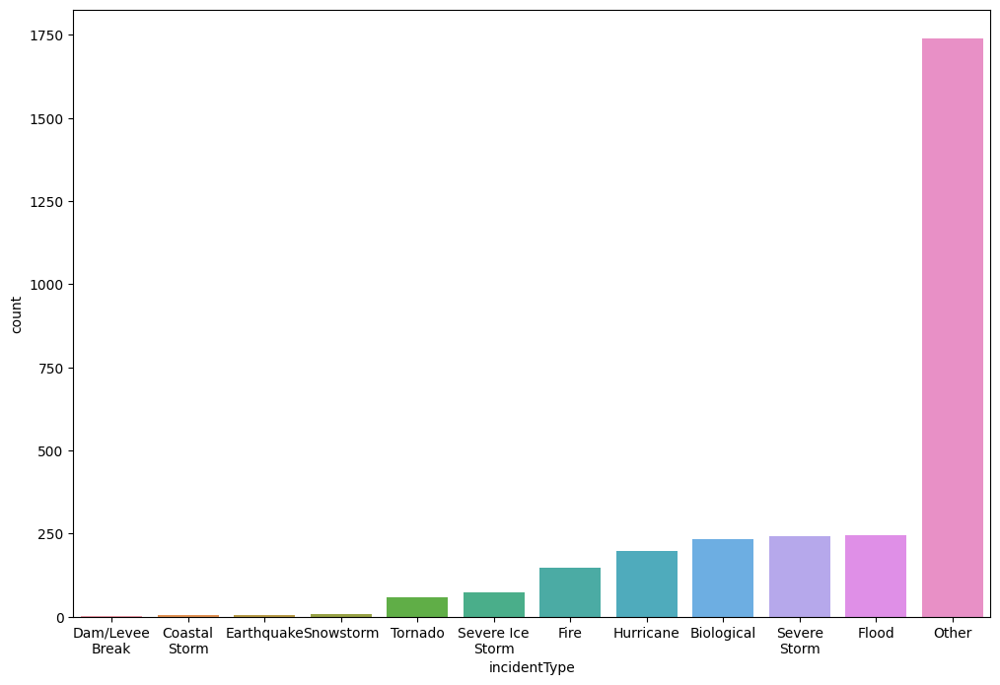

In [ ]:
def wrap_labels(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=0)

fig, ax = plt.subplots(figsize=(12, 8))

sns.countplot(x=main_df["incidentType"], order=main_df["incidentType"].value_counts(ascending=True).index)
wrap_labels(ax, 10)

In [ ]:
# Process of one hot encoding
ohe_incidentType = OneHotEncoder(categories=[main_df["incidentType"].unique()]) 
incidentType_encoded = ohe_incidentType.fit_transform(np.array(main_df["incidentType"]).reshape(-1,1))
incidentType_encoded.toarray()

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# Present One hot encoded feature in df
ohe_incidentType_df = pd.DataFrame(incidentType_encoded.toarray())
ohe_incidentType_df = ohe_incidentType_df.rename(columns={index:val for index,val in enumerate(main_df["incidentType"].unique())})
ohe_incidentType_df

,Other,Severe Storm,Tornado,Biological,Hurricane,Flood,Fire,Earthquake,Snowstorm,Severe Ice Storm,Coastal Storm,Dam/Levee Break
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2949,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2950,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2951,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2952,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Merge Back into main dataframe
main_df = main_df.join(ohe_incidentType_df)
main_df.head()

,state,date,temperature,wind_speed,precipitation,incidentType,declarationType,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,...,Tornado,Biological,Hurricane,Flood,Fire,Earthquake,Snowstorm,Severe Ice Storm,Coastal Storm,Dam/Levee Break
0,AL,2019-01-01,6.502151,2.248387,5.059876,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AL,2019-02-01,12.298810,2.887500,7.583426,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AL,2019-03-01,11.730108,2.693548,3.212986,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AL,2019-03-01,11.730108,2.693548,3.212986,Tornado,DR,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AL,2019-04-01,17.451111,2.298333,5.923294,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 4.3 One Hot Encoding (declarationType)

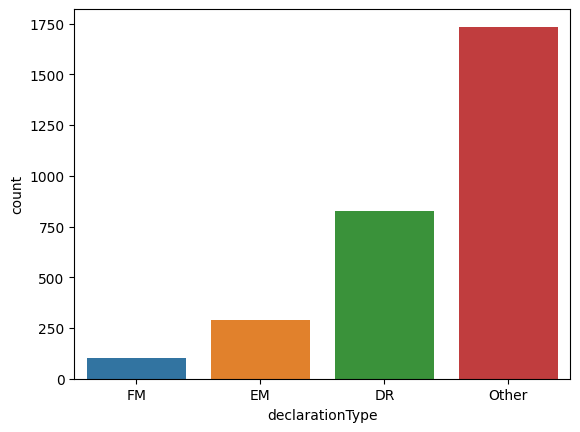

In [ ]:
sns.countplot(x=main_df["declarationType"], order=main_df["declarationType"].value_counts(ascending=True).index)
wrap_labels(ax, 10)

In [ ]:
# Process of one hot encoding
ohe_declarationType = OneHotEncoder(categories=[main_df["declarationType"].unique()]) 
declarationType_encoded = ohe_declarationType.fit_transform(np.array(main_df["declarationType"]).reshape(-1,1))
declarationType_encoded.toarray()

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       ...,
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.]])

In [ ]:
# Present One hot encoded feature in df
ohe_declarationType_df = pd.DataFrame(declarationType_encoded.toarray())
ohe_declarationType_df = ohe_declarationType_df.rename(columns={index:val for index,val in enumerate(main_df["declarationType"].unique())})
ohe_declarationType_df

,Other,DR,EM,FM
0,1.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0
2,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0
...,...,...,...,...
2949,1.0,0.0,0.0,0.0
2950,1.0,0.0,0.0,0.0
2951,1.0,0.0,0.0,0.0
2952,1.0,0.0,0.0,0.0


In [ ]:
# Merge Back into main dataframe
main_df = main_df.join(ohe_declarationType_df, rsuffix='_declarationType')
main_df.head()

,state,date,temperature,wind_speed,precipitation,incidentType,declarationType,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,...,Fire,Earthquake,Snowstorm,Severe Ice Storm,Coastal Storm,Dam/Levee Break,Other_declarationType,DR,EM,FM
0,AL,2019-01-01,6.502151,2.248387,5.059876,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,AL,2019-02-01,12.298810,2.887500,7.583426,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,AL,2019-03-01,11.730108,2.693548,3.212986,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,AL,2019-03-01,11.730108,2.693548,3.212986,Tornado,DR,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,AL,2019-04-01,17.451111,2.298333,5.923294,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


### 4.4 One Hot Encoding (state)

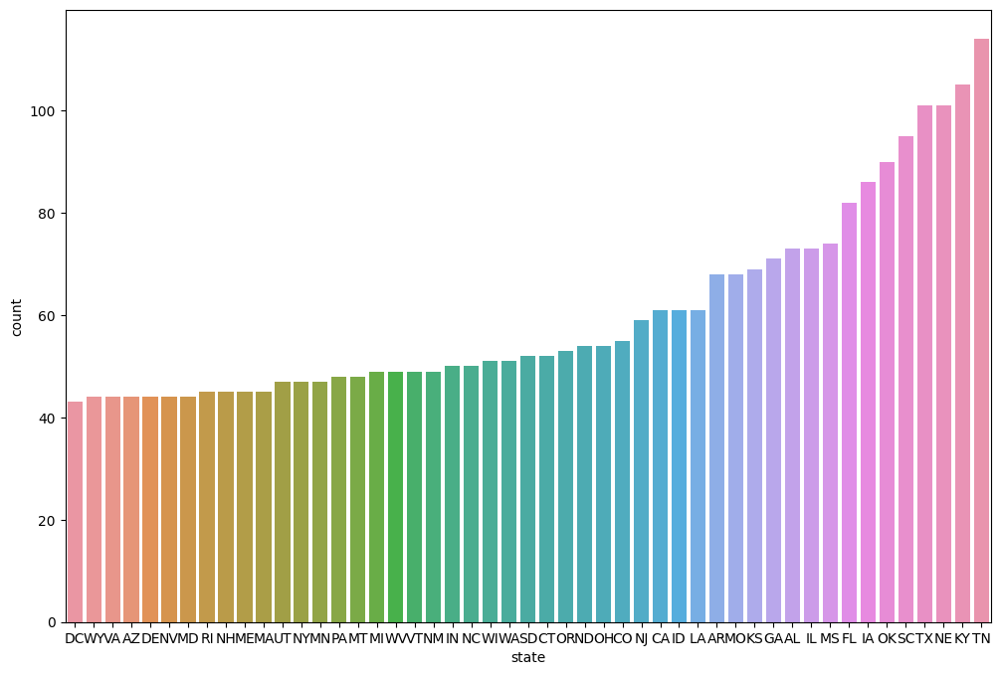

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.countplot(x=main_df["state"], order=main_df["state"].value_counts(ascending=True).index)
wrap_labels(ax, 10)

In [ ]:
# Process of one hot encoding
ohe_state = OneHotEncoder(categories=[main_df["state"].unique()]) 
state_encoded = ohe_state.fit_transform(np.array(main_df["state"]).reshape(-1,1))
state_encoded.toarray()

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [ ]:
# Present One hot encoded feature in df
ohe_state_df = pd.DataFrame(state_encoded.toarray())
ohe_state_df = ohe_state_df.rename(columns={index:val for index,val in enumerate(main_df["state"].unique())})
ohe_state_df

,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2949,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2950,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2951,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2952,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
# Merge Back into main dataframe
main_df = main_df.join(ohe_state_df)
main_df.head()

,state,date,temperature,wind_speed,precipitation,incidentType,declarationType,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,AL,2019-01-01,6.502151,2.248387,5.059876,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AL,2019-02-01,12.298810,2.887500,7.583426,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AL,2019-03-01,11.730108,2.693548,3.212986,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AL,2019-03-01,11.730108,2.693548,3.212986,Tornado,DR,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AL,2019-04-01,17.451111,2.298333,5.923294,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 4.5 Convert Date String to Epoch

In [ ]:
main_df["date"] = main_df["date"].apply(lambda dateStr: pd.Timestamp(dateStr).timestamp())

In [ ]:
main_df.head()

,state,date,temperature,wind_speed,precipitation,incidentType,declarationType,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,AL,1.546301e+09,6.502151,2.248387,5.059876,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AL,1.548979e+09,12.298810,2.887500,7.583426,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AL,1.551398e+09,11.730108,2.693548,3.212986,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AL,1.551398e+09,11.730108,2.693548,3.212986,Tornado,DR,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AL,1.554077e+09,17.451111,2.298333,5.923294,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
main_df.shape # main_df is now cleaned and suitable for analysis

(2954, 95)

# 5.0 Exploratory Data Analysis (EDA)

Overview of main_df

In [ ]:
main_df.head()

,state,date,temperature,wind_speed,precipitation,incidentType,declarationType,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,AL,1.546301e+09,6.502151,2.248387,5.059876,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AL,1.548979e+09,12.298810,2.887500,7.583426,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AL,1.551398e+09,11.730108,2.693548,3.212986,Severe Storm,DR,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AL,1.551398e+09,11.730108,2.693548,3.212986,Tornado,DR,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AL,1.554077e+09,17.451111,2.298333,5.923294,Other,Other,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
main_df.shape

(2954, 30)

In [ ]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2954 entries, 0 to 2953
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   2954 non-null   object 
 1   date                    2954 non-null   object 
 2   temperature             2954 non-null   float64
 3   wind_speed              2954 non-null   float64
 4   precipitation           2954 non-null   float64
 5   incidentType            2954 non-null   object 
 6   declarationType         2954 non-null   object 
 7   paProgramDeclared       2954 non-null   float64
 8   iaProgramDeclared       2954 non-null   float64
 9   ihProgramDeclared       2954 non-null   float64
 10  trips_pop_at_home       2954 non-null   float64
 11  trips_pop_not_at_home   2954 non-null   float64
 12  trips_n_total           2954 non-null   float64
 13  trips_n_lt_1            2954 non-null   float64
 14  trips_n_1_3             2954 non-null   

In [ ]:
main_df.describe()

,temperature,wind_speed,precipitation,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,trips_pop_at_home,trips_pop_not_at_home,trips_n_total,trips_n_lt_1,...,trips_n_100_250,trips_n_250_500,trips_n_gt_500,price_wti,index_ipi,consumption-for-eg-btu,consumption-uto-btu,generation,total-consumption-btu,disasterCount
count,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2.954000e+03,2.954000e+03,2.954000e+03,...,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000,2954.000000
mean,11.620124,3.473493,3.233808,1.566689,1.174678,1.281313,58518.455511,2.015100e+05,9.680746e+05,2.543919e+05,...,5774.709137,1266.207567,1169.843649,61.177955,99.936141,70.113111,5.289091,7745.043453,75.402202,6.037576
std,9.698285,1.702796,2.113545,0.535677,0.984792,0.902498,69046.024647,2.082394e+05,1.025660e+06,2.940066e+05,...,5187.694669,1339.559256,2016.522865,20.141302,4.131229,66.931110,7.628414,7730.235752,73.366723,17.566947
min,-17.259091,0.835484,0.000000,0.000000,0.000000,0.000000,4846.637450,1.954619e+04,7.258170e+04,1.840663e+04,...,864.120087,137.132113,35.700119,16.547619,84.201800,0.127530,0.010140,12.030220,0.183500,1.000000
25%,3.815000,2.528333,1.616880,1.000000,0.000000,0.000000,15900.345314,6.346449e+04,2.917435e+05,6.907337e+04,...,2553.133548,452.797984,225.153098,52.008421,99.161800,33.094053,0.680025,3454.355195,33.946705,1.000000
50%,11.339677,3.275834,3.030377,2.000000,2.000000,2.000000,30203.346519,1.174592e+05,5.799503e+05,1.413187e+05,...,4213.627600,904.655123,474.384718,57.519048,101.234100,52.277430,3.248170,5676.668780,55.036480,1.000000
75%,19.514815,3.974194,4.397210,2.000000,2.000000,2.000000,64574.053099,2.080516e+05,1.078833e+06,2.857306e+05,...,6791.641731,1491.919196,1301.809228,71.378182,102.451900,85.052683,5.951500,9288.390648,93.760640,2.000000
max,32.100000,14.070370,14.000000,2.000000,2.000000,2.000000,469319.450501,1.116978e+06,6.499283e+06,1.736964e+06,...,34153.584746,9595.932203,29664.984946,108.502609,103.467700,472.530990,45.252060,55091.773320,515.866880,437.000000


Text(0.5, 1.0, 'Boxplot of Numerical Variables')

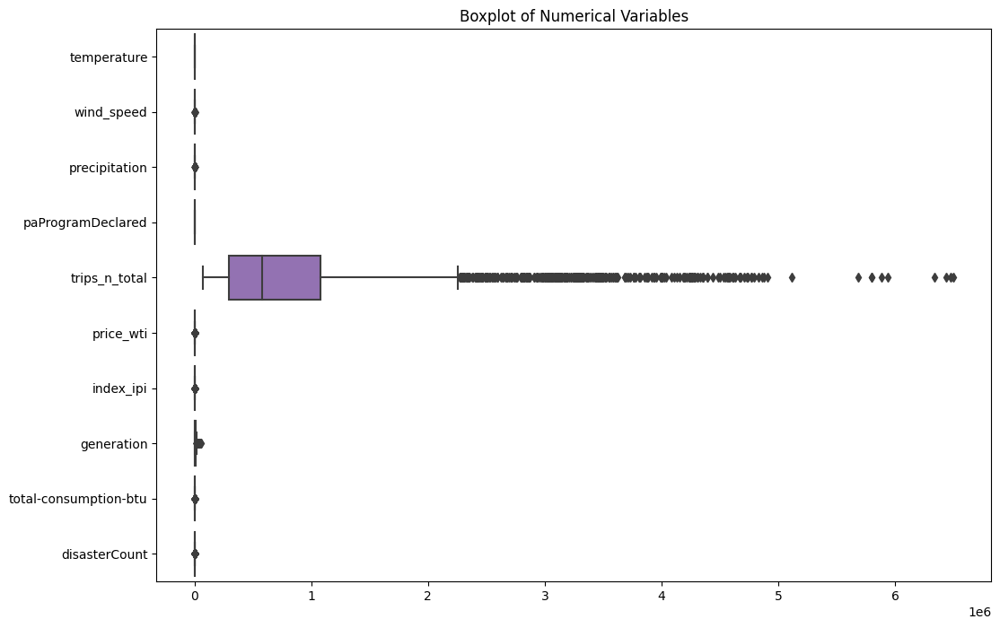

In [ ]:
#check for outliers
plt.figure(figsize=(12,8))
numerical_values = main_df[['temperature', 'wind_speed', 'precipitation', 'paProgramDeclared', 'trips_n_total', 'price_wti', 'index_ipi', 'generation', 'total-consumption-btu', 'disasterCount']]
sns.boxplot(data=numerical_values, orient='h')
plt.title("Boxplot of Numerical Variables")

Text(0.5, 1.0, 'Boxplot of trips_n_total')

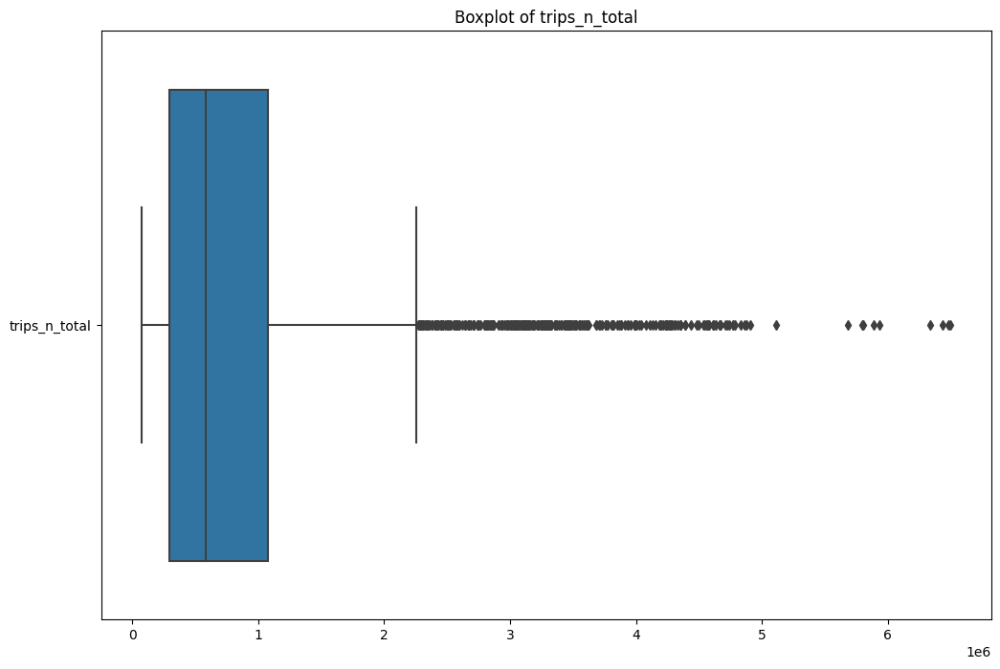

In [ ]:
#check for outliters for transportation data
transportation_df = main_df[['trips_pop_at_home',
'trips_pop_not_at_home',
'trips_n_total',
'trips_n_lt_1',
'trips_n_1_3',
'trips_n_3_5',
'trips_n_5_10',
'trips_n_10_25',
'trips_n_25_50',
'trips_n_100_250',
'trips_n_250_500',
'trips_n_gt_500'
]]

trips_n_total = main_df[['trips_n_total']]
plt.figure(figsize=(12,8))
sns.boxplot(data=trips_n_total, orient='h')
plt.title("Boxplot of trips_n_total")

#### **5.1 Histogram - Distribution of Numerical Variables**
- Identifying the distribution of the variables in order to check if assumptions are satisifed to run certain models.

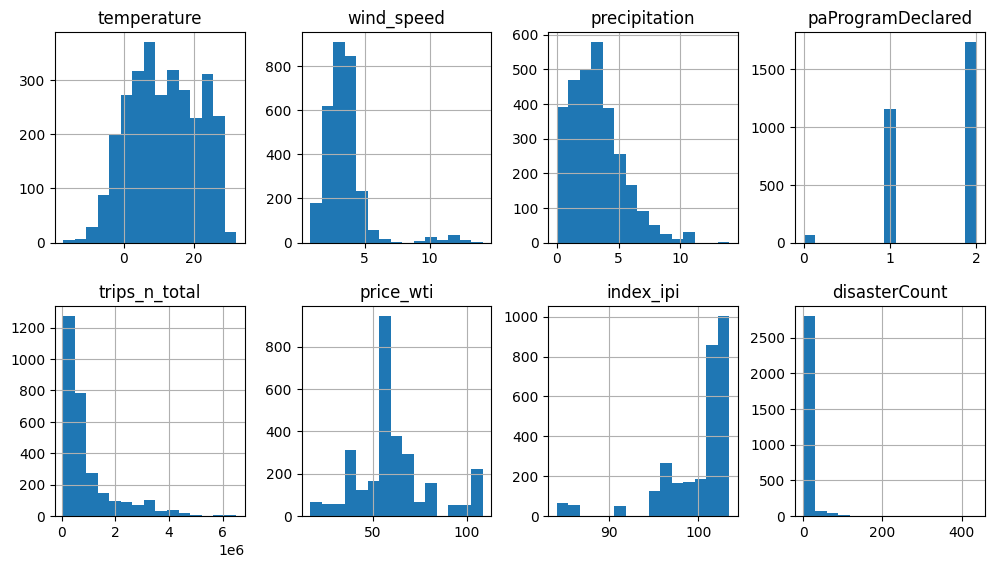

In [ ]:
# Drop out irrelvant features
features = main_df.drop(columns=["total-consumption-btu", 'consumption-for-eg-btu',
       'consumption-uto-btu', 'generation', 'iaProgramDeclared', 'ihProgramDeclared', 'trips_pop_at_home',
       'trips_pop_not_at_home', 'trips_n_lt_1', 'trips_n_1_3',
       'trips_n_3_5', 'trips_n_5_10', 'trips_n_10_25', 'trips_n_25_50',
       'Number of Trips 50-100', 'trips_n_100_250', 'trips_n_250_500',
       'trips_n_gt_500'])

features.hist(bins=15, figsize=(12, 88), layout=(25, 4));

*   wind_speed, precipitation, trips_n_total, disasterCount are right-skewed.
*   index_ipi and paProgramDeclared are left-skewed 
*   temperature and price_wti are normally distributed

#### **5.2 Bivariate Relationship Between Variables**

To identify relationships between the energy usage and temperature

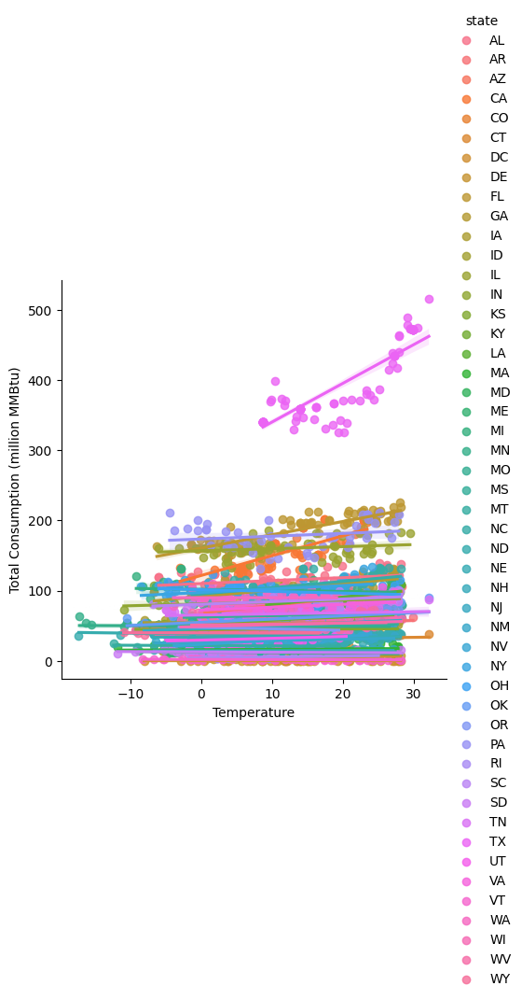

In [ ]:
sns.lmplot(x='temperature', y='total-consumption-btu', hue='state', data=main_df).set(
    xlabel="Temperature", ylabel="Total Consumption (million MMBtu)", title='')


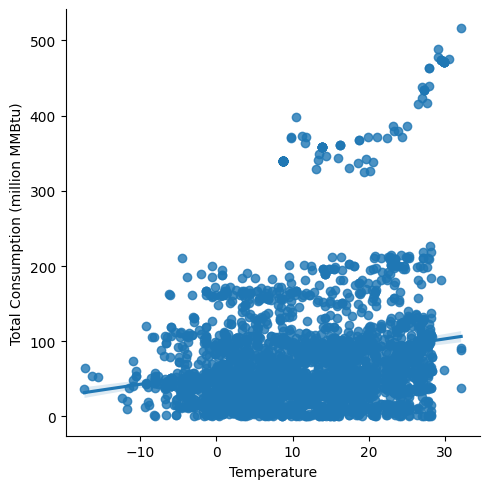

In [ ]:
sns.lmplot(x='temperature', y='total-consumption-btu', data=main_df).set(xlabel ="Temperature", ylabel = "Total Consumption (million MMBtu)", title ='')

In [ ]:
# Look at summary statistics for the target variable
print(main_df['total-consumption-btu'].describe())

count    2954.000000
mean       75.402202
std        73.366723
min         0.183500
25%        33.946705
50%        55.036480
75%        93.760640
max       515.866880
Name: total-consumption-btu, dtype: float64


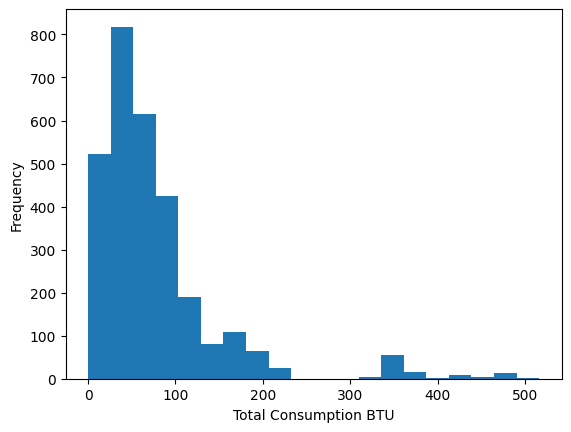

In [ ]:
# Visualize the distribution of the target variable
plt.hist(main_df['total-consumption-btu'], bins=20)
plt.xlabel('Total Consumption BTU')
plt.ylabel('Frequency')
plt.show()

#### **5.3 Correlation**

In [ ]:
# Compute the correlation matrix
corr_matrix = main_df.corr()
corr_matrix

,temperature,wind_speed,precipitation,paProgramDeclared,iaProgramDeclared,ihProgramDeclared,trips_pop_at_home,trips_pop_not_at_home,trips_n_total,trips_n_lt_1,...,trips_n_100_250,trips_n_250_500,trips_n_gt_500,price_wti,index_ipi,consumption-for-eg-btu,consumption-uto-btu,generation,total-consumption-btu,disasterCount
temperature,1.000000,-0.077049,0.268168,-0.043400,-0.037722,-0.054022,0.039297,0.069027,0.069397,0.043480,...,0.087120,0.102805,0.151622,-0.012169,-0.072131,0.199818,0.168797,0.200205,0.199841,-0.060171
wind_speed,-0.077049,1.000000,-0.025212,0.031561,0.026747,0.021707,-0.140631,-0.144342,-0.134888,-0.127170,...,-0.113337,-0.098425,-0.111984,0.023856,-0.017224,0.054523,0.031399,0.043546,0.053005,0.046445
precipitation,0.268168,-0.025212,1.000000,-0.228768,-0.219178,-0.205458,-0.061733,-0.040161,-0.032127,-0.039622,...,-0.103221,-0.089359,-0.028937,-0.048393,0.015506,0.012544,0.056894,0.015463,0.017360,0.056373
paProgramDeclared,-0.043400,0.031561,-0.228768,1.000000,0.965202,0.889649,0.092660,0.083702,0.116663,0.123718,...,0.066981,0.062291,0.111717,0.077561,-0.032216,-0.163629,-0.139753,-0.163297,-0.163806,-0.311278
iaProgramDeclared,-0.037722,0.026747,-0.219178,0.965202,1.000000,0.950199,0.088480,0.080635,0.116842,0.124867,...,0.061078,0.053998,0.108449,0.087646,-0.032649,-0.167755,-0.145198,-0.167141,-0.168137,-0.342174
ihProgramDeclared,-0.054022,0.021707,-0.205458,0.889649,0.950199,1.000000,0.072802,0.064362,0.099845,0.109221,...,0.043854,0.035382,0.085301,0.091774,-0.024156,-0.173297,-0.147207,-0.172263,-0.173401,-0.304465
trips_pop_at_home,0.039297,-0.140631,-0.061733,0.092660,0.088480,0.072802,1.000000,0.954358,0.909059,0.898814,...,0.867496,0.834544,0.626772,-0.048431,-0.101652,0.122870,0.026548,0.143948,0.114853,-0.072409
trips_pop_not_at_home,0.069027,-0.144342,-0.040161,0.083702,0.080635,0.064362,0.954358,1.000000,0.966990,0.934281,...,0.905602,0.847737,0.667935,0.017848,-0.009268,0.176707,0.061941,0.199141,0.167647,-0.065569
trips_n_total,0.069397,-0.134888,-0.032127,0.116663,0.116842,0.099845,0.909059,0.966990,1.000000,0.983477,...,0.827747,0.796456,0.724798,0.078392,0.061741,0.112692,0.007611,0.131472,0.103598,-0.075947
trips_n_lt_1,0.043480,-0.127170,-0.039622,0.123718,0.124867,0.109221,0.898814,0.934281,0.983477,1.000000,...,0.791384,0.785834,0.690687,0.104076,0.052933,0.087500,-0.007581,0.105624,0.079036,-0.078160


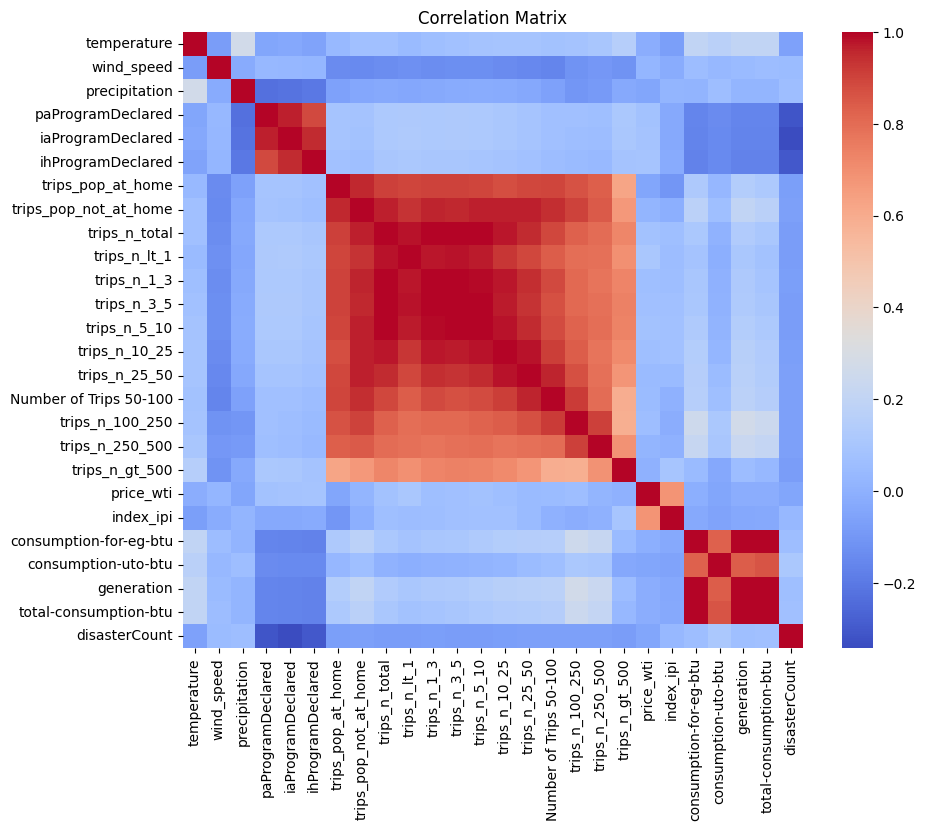

In [ ]:
# Visualize the correlation matrix
corr_matrix = main_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
highly_correlated = abs(corr_matrix[corr_matrix > 0.75])
print(highly_correlated[corr_matrix < 1.0].stack().to_string())

paProgramDeclared       iaProgramDeclared         0.965202
                        ihProgramDeclared         0.889649
iaProgramDeclared       paProgramDeclared         0.965202
                        ihProgramDeclared         0.950199
ihProgramDeclared       paProgramDeclared         0.889649
                        iaProgramDeclared         0.950199
trips_pop_at_home       trips_pop_not_at_home     0.954358
                        trips_n_total             0.909059
                        trips_n_lt_1              0.898814
                        trips_n_1_3               0.902209
                        trips_n_3_5               0.902042
                        trips_n_5_10              0.896754
                        trips_n_10_25             0.878069
                        trips_n_25_50             0.890225
                        Number of Trips 50-100    0.896714
                        trips_n_100_250           0.867496
                        trips_n_250_500           0.8345

#### **5.4 Scatter Plot**

To identify correlations between variables

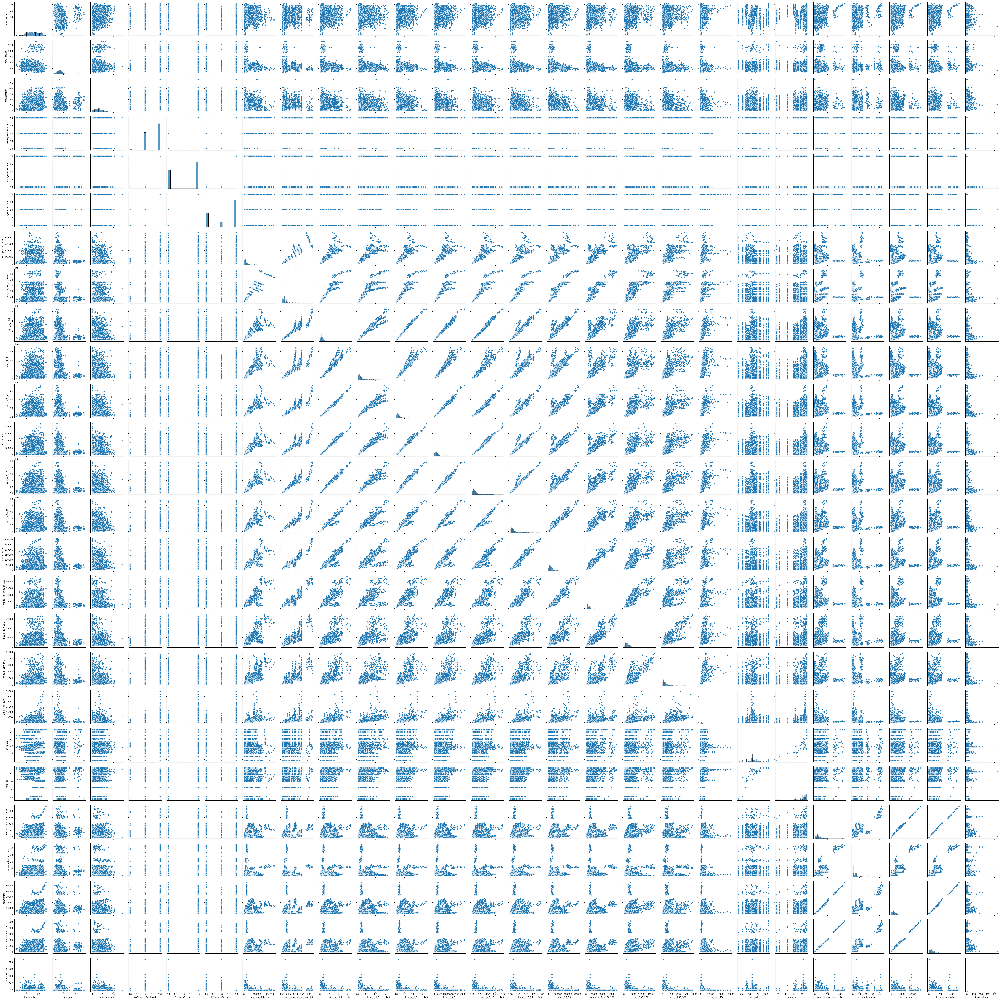

In [ ]:
sns.pairplot(main_df, kind='scatter')
plt.show()

#### **5.5 Line Plot**

To identify trends and seasonality between months and total energy consumption

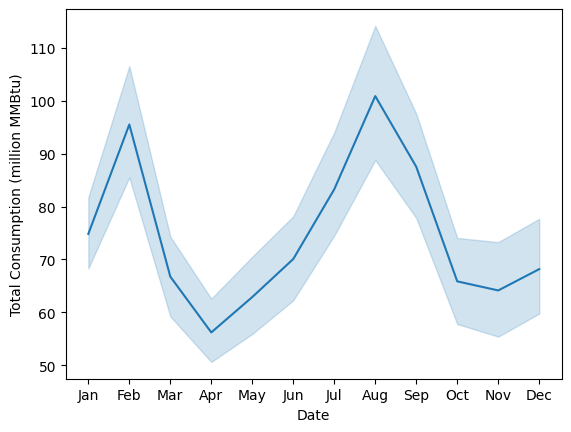

<Figure size 3000x800 with 0 Axes>

In [ ]:
main_df_month = main_df
# main_df_month['date'] = pd.to_datetime(main_df_month['date'], unit='s')
main_df_month['month'] = pd.to_datetime(
    main_df_month['date']).dt.month_name().str.slice(stop=3)

fig = sns.lineplot(x='month', y='total-consumption-btu', data=main_df_month).set(
    xlabel="Date", ylabel="Total Consumption (million MMBtu)", title='')
plt.figure(figsize=(30, 8))
plt.show(fig)


To visualise how electricity prices change over time

<Axes: xlabel='date', ylabel='price_wti'>

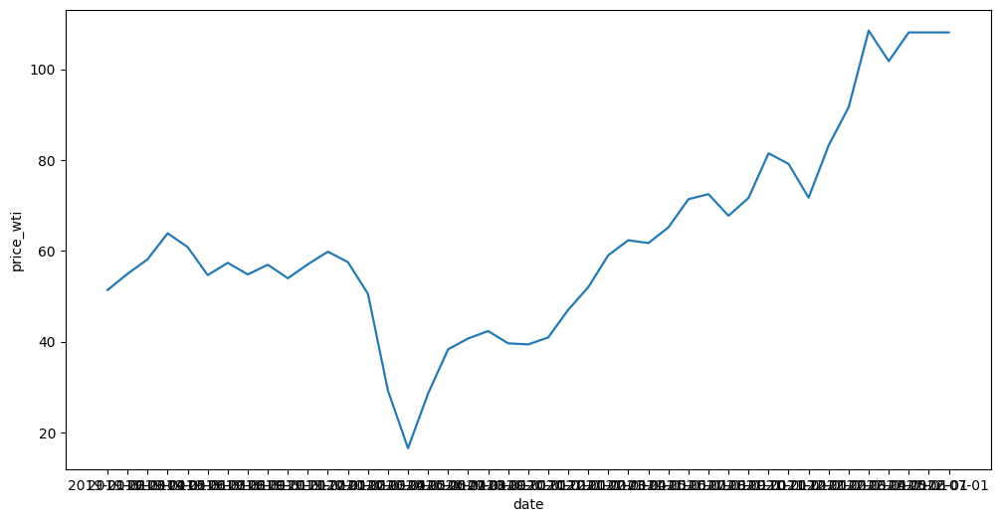

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=main_df, x='date', y='price_wti')

#### **5.6 Categorical Variables**

<Figure size 1200x600 with 0 Axes>

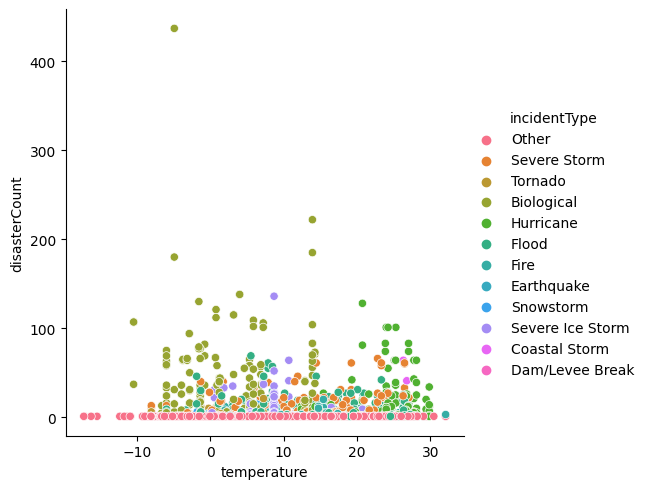

In [ ]:
# To visualise the relationship between disaster count and incident type
plt.figure(figsize=(12, 6))
sns.relplot(data=main_df, x="temperature", y="disasterCount", hue="incidentType")

[Text(0.5, 0, 'Incident Type'), Text(0, 0.5, 'Count'), Text(0.5, 1.0, '')]

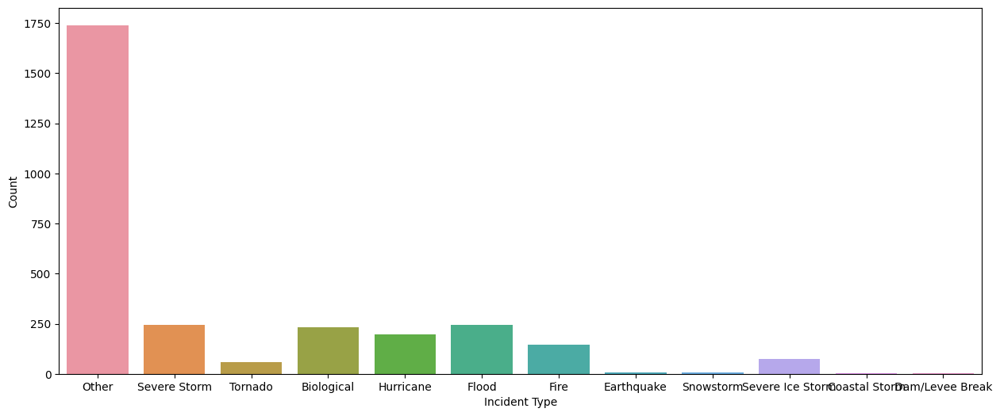

In [ ]:
# Bar Plot to visualise the frequency of different types of natural disasters to identity which types of disasters are most common
plt.figure(figsize=(15, 6))
sns.countplot(data=main_df, x='incidentType').set(xlabel ="Incident Type", ylabel = "Count", title ='')

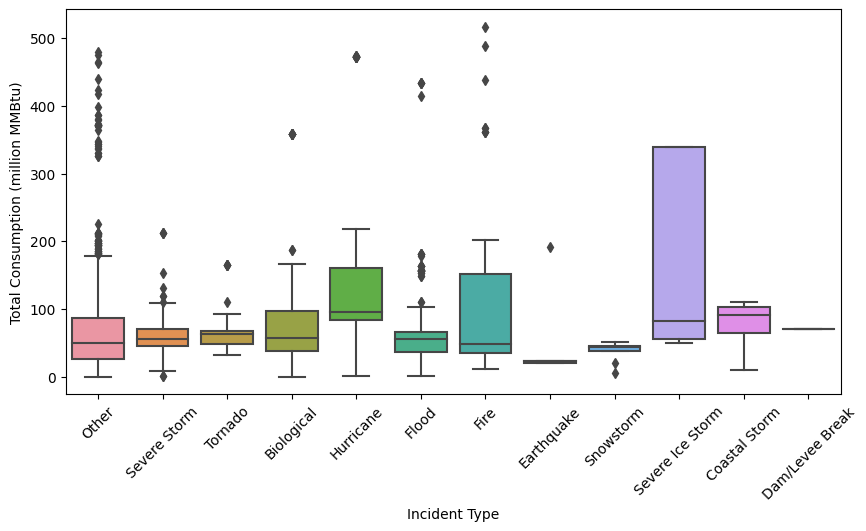

In [ ]:
# Visualize the relationship between the target variable and categorical variables
plt.figure(figsize=(10, 5))
sns.boxplot(x='incidentType', y='total-consumption-btu', data=main_df).set(xlabel ="Incident Type", ylabel = "Total Consumption (million MMBtu)", title ='')
plt.xticks(rotation=45)
plt.show()

# 6.0 Model Training

### 6.1 Train Test Split

In this section, we will be splitting the dataset into a training set as well as a testing set.

In [ ]:
# Sort the dataframe by date
main_df = main_df.sort_values(by='date')
# Drop out irrelvant features
features = main_df.drop(columns=['incidentType', 'declarationType', 'state', "total-consumption-btu", 'consumption-for-eg-btu',
       'consumption-uto-btu', 'generation', 'iaProgramDeclared', 'ihProgramDeclared', 'trips_pop_at_home',
       'trips_pop_not_at_home', 'trips_n_lt_1', 'trips_n_1_3',
       'trips_n_3_5', 'trips_n_5_10', 'trips_n_10_25', 'trips_n_25_50',
       'Number of Trips 50-100', 'trips_n_100_250', 'trips_n_250_500',
       'trips_n_gt_500'])
# Split the features from the target variable
target = main_df['total-consumption-btu']
# Splitting the dataset into 70% for Train, 30% for Test
X_train, X_test, y_train, y_test = features.iloc[ :2068, :], features.iloc[ 2068: , :], target.iloc[:2068], target.iloc[2068:]

### 6.2 Gradient Boosting Machine (GBM)

We chose GBM, which is a tree-based ensemble model, as it can handle a mix of numerical and categorical features, and is generally robust to outliers and missing data. 

A GBM builds a series of decision trees sequentially, with each new tree attempting to correct the errors made by the previous one. This will allow it to combines the predictions from multiple decision trees to generate the final predictions. 

In [ ]:
#create a gradient boosting regressor

gbm = GradientBoostingRegressor(random_state=42)

In [ ]:
#set up our parameter grid for hyperparam tuning
param_dist = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1],
    'max_features': ['sqrt', 'log2', None]
}

In [ ]:
#grid search with cross-validation to find the best hyperparams

random_search = RandomizedSearchCV(estimator=gbm, param_distributions=param_dist, n_iter=15,
                                   scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
random_search.fit(X_train, y_train.values.ravel())

Fitting 5 folds for each of 15 candidates, totalling 75 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(random_state=42),
                   n_iter=15, n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [3, 4, 5],
                                        'max_features': ['sqrt', 'log2', None],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.8, 0.9, 1]},
                   scoring='neg_mean_squared_error', verbose=1)

In [ ]:
#get the best hyperparams

best_params = random_search.best_params_
print("Best hyperparameters found: ", best_params)

Best hyperparameters found:  {'subsample': 0.9, 'n_estimators': 300, 'max_features': None, 'max_depth': 4, 'learning_rate': 0.1}


In [ ]:
#train gbm model

best_gbm = GradientBoostingRegressor(**best_params, random_state=42)
best_gbm.fit(X_train, y_train.values.ravel())

GradientBoostingRegressor(max_depth=4, n_estimators=300, random_state=42,
                          subsample=0.9)

In [ ]:
#predict for test set

y_pred = best_gbm.predict(X_test)

In [ ]:
#measure adjusted R2
def adj_R2(x_train,y_train):
  r2 = best_gbm.score(x_train,y_train)
  n = x_train.shape[0]
  p = x_train.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2 = adj_R2(X_train,y_train)

def adj_R2_test(x_test,y_test):
  r2 = best_gbm.score(x_test,y_test)
  n = x_test.shape[0]
  p = x_test.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2_test = adj_R2_test(X_test,y_test)

In [ ]:
#some possible evaluations of model performance

#evaludate performace
print('R2-Train                      : {0:.4f}'.format(best_gbm.score(X_train, y_train)))
print('R2-Test                       : {0:.4f}'.format(best_gbm.score(X_test, y_test)))
print('Adj_R2-Train                  : {0:.4f}'.format(adj_R2))
print('Adj_R2-Test                   : {0:.4f}'.format(adj_R2_test))
print('MSE (Mean Squared Error)      : {0:.4f}'.format(mean_squared_error(y_test, y_pred)))
print('RMSE (Root Mean Squared Error): {0:.4f}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
print('MAE (Mean Ablosute Error)     : {0:.4f}'.format(mean_absolute_error(y_test, y_pred)))

### 6.3 Random Forest Regressor (RF)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

# Parameters to be tuned
n_estimators = [50, 100, 150, 200, 250, 300]
min_samples_split = [2, 5, 10, 15, 20]
min_samples_leaf = [1, 2, 4, 6, 8]
max_features = ['log2', 'sqrt', 1.0]
max_leaf_nodes = [50, 100, 200, 300, 400]

# Placing parameters into a dictionary
parameters= {
    'n_estimators': n_estimators,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'max_features': max_features,
    'max_leaf_nodes': max_leaf_nodes
}

# Finding the best parameters based on the data
forest = RandomizedSearchCV(RandomForestRegressor(), parameters, verbose=3, scoring='neg_mean_squared_error', random_state=42, n_iter=5, cv=10)
forest.fit(X_train, y_train)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
[CV 1/10] END max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_samples_split=15, n_estimators=150;, score=-353.894 total time=   2.2s
[CV 2/10] END max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_samples_split=15, n_estimators=150;, score=-513.183 total time=   0.7s
[CV 3/10] END max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_samples_split=15, n_estimators=150;, score=-1003.762 total time=   0.7s
[CV 4/10] END max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_samples_split=15, n_estimators=150;, score=-935.508 total time=   0.7s
[CV 5/10] END max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_samples_split=15, n_estimators=150;, score=-1093.410 total time=   0.6s
[CV 6/10] END max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_samples_split=15, n_estimators=150;, score=-435.200 total time=   0.5s
[CV 7/10] END max_features=sqrt, max_leaf_nodes=50, min

RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(), n_iter=5,
                   param_distributions={'max_features': ['log2', 'sqrt', 1.0],
                                        'max_leaf_nodes': [50, 100, 200, 300,
                                                           400],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 15, 20],
                                        'n_estimators': [50, 100, 150, 200, 250,
                                                         300]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=3)

In [ ]:
rf = forest.best_estimator_

In [ ]:
#measure adjusted R2
def adj_R2(x_train,y_train):
  r2 = rf.score(x_train,y_train)
  n = x_train.shape[0]
  p = x_train.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2 = adj_R2(X_train,y_train)

def adj_R2_test(x_test,y_test):
  r2 = rf.score(x_test,y_test)
  n = x_test.shape[0]
  p = x_test.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2_test = adj_R2_test(X_test,y_test)

In [ ]:
pred = rf.predict(X_test)

from sklearn.metrics import mean_absolute_error, mean_squared_error,confusion_matrix,r2_score

#evaludate performace
print('R2-Train                      : {0:.2f}'.format(rf.score(X_train, y_train)*100))
print('R2-Test                       : {0:.2f}'.format(rf.score(X_test, y_test)*100))
print('Adj_R2-Train                  : {0:.2f}'.format(adj_R2*100))
print('Adj_R2-Test                   : {0:.2f}'.format(adj_R2_test*100))
print('MSE (Mean Squared Error)      : {0:.0f}'.format(mean_squared_error(y_test, pred)))
print('RMSE (Root Mean Squared Error): {0:.0f}'.format(np.sqrt(mean_squared_error(y_test, pred))))
print('MAE (Mean Ablosute Error)     : {0:.0f}'.format(mean_absolute_error(y_test, pred)))

R2-Train                      : 98.65
R2-Test                       : 96.31
Adj_R2-Train                  : 98.60
Adj_R2-Test                   : 95.98
MSE (Mean Squared Error)      : 169
RMSE (Root Mean Squared Error): 13
MAE (Mean Ablosute Error)     : 9


### 6.4 Linear Regression
There is no hyperparameter tuning for LR. Ridge regression can be tuned

In [ ]:
#import libraries
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error,confusion_matrix,r2_score

In [ ]:
#fit model
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
#R2 score
def eval(model):
    print("The training score is,",model.score(X_train,y_train),end='\n')
    print("The testing score is,",model.score(X_test,y_test))

eval(reg)

The training score is, 0.9770738588307277
The testing score is, 0.9614998072845413


<Axes: xlabel='total-consumption-btu', ylabel='Count'>

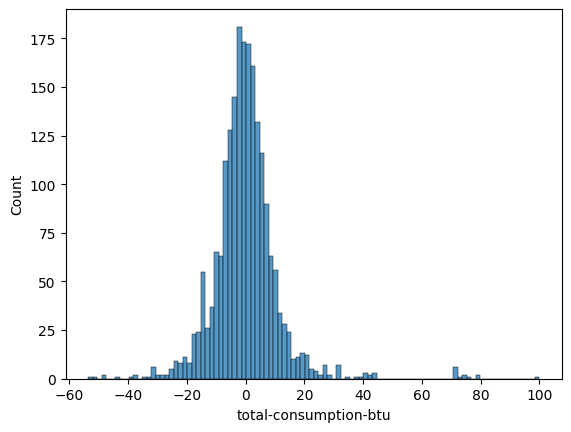

In [ ]:
# make the prediction check the assumption of normality.
y_hat_train = reg.predict(X_train)

sns.histplot(y_train - y_hat_train)

In [ ]:
def metric_score(ypred, y_test):
    print("The mean absolute error is: ", mean_absolute_error(ypred,y_test))
    print("The mean squared error is: ",mean_squared_error(ypred,y_test))
    print("The R2 score is: ",r2_score(ypred,y_test))
    
y_hat = reg.predict(X_test)  
metric_score(y_hat,y_test)

The mean absolute error is:  8.70794186328765
The mean squared error is:  175.98021402577191
The R2 score is:  0.9561263696997844


In [ ]:
#measure adjusted R2
def adj_R2(x_train,y_train):
  r2 = reg.score(x_train,y_train)
  n = x_train.shape[0]
  p = x_train.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2 = adj_R2(X_train,y_train)
print(adj_R2)

0.9762226122444125


In [ ]:
def adj_R2_test(x_test,y_test):
  r2 = reg.score(x_test,y_test)
  n = x_test.shape[0]
  p = x_test.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2_test = adj_R2_test(X_test,y_test)
print(adj_R2_test)

0.9579868427211086


In [ ]:
#evaluate performace
print('R2-Train                      : {0:.2f}'.format(reg.score(X_train, y_train)*100))
print('R2-Test                       : {0:.2f}'.format(reg.score(X_test, y_test)*100))
print('Adj_R2-Train                  : {0:.2f}'.format(adj_R2*100))
print('Adj_R2-Test                   : {0:.2f}'.format(adj_R2_test*100))

#report on testing 
print('MSE (Mean Squared Error)      : {0:.2f}'.format(mean_squared_error(y_test, y_hat)))
print('RMSE (Root Mean Squared Error): {0:.2f}'.format(np.sqrt(mean_squared_error(y_test, y_hat))))
print('MAE (Mean Ablosute Error)     : {0:.2f}'.format(mean_absolute_error(y_test, y_hat)))

R2-Train                      : 97.71
R2-Test                       : 96.15
Adj_R2-Train                  : 97.62
Adj_R2-Test                   : 95.80
MSE (Mean Squared Error)      : 175.98
RMSE (Root Mean Squared Error): 13.27
MAE (Mean Ablosute Error)     : 8.71


### 6.5 Ridge regression

In [ ]:
# random search ridge regression model
from sklearn.linear_model import Ridge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform

In [ ]:
from scipy.sparse.linalg._isolve.lgmres import lgmres
# define model
model = Ridge()
# define evaluation
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['svd', 'cholesky', 'lsqr', 'sag']
space['alpha'] = loguniform(1e-5, 100)
space['fit_intercept'] = [True, False]
# define search
search = RandomizedSearchCV(model, space, n_iter=20, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)
# execute search
result = search.fit(X_train, y_train)
# summarize result
print("--------------Best linear regression ridge model after hyperparameter tuning------------")
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

lg = Ridge(solver = result.best_params_['solver'], alpha = result.best_params_['alpha'],
               fit_intercept = result.best_params_['fit_intercept'])

lg.fit(X_train, y_train)
pred = lg.predict(X_test)

#measure adjusted R2
def adj_R2(x_train,y_train):
  r2 = lg.score(x_train,y_train)
  n = x_train.shape[0]
  p = x_train.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2 = adj_R2(X_train,y_train)

def adj_R2_test(x_test,y_test):
  r2 = lg.score(x_test,y_test)
  n = x_test.shape[0]
  p = x_test.shape[1]
  adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
  return adjusted_r2

adj_R2_test = adj_R2_test(X_test,y_test)

print("-------------------Performace evaluation on test set---------------")
print('R2-Test                       : {0:.2f}'.format(lg.score(X_test, y_test)*100))
print('Adj_R2-Test                   : {0:.2f}'.format(adj_R2_test*100))
# Evaluation Metrics
print(f"Mean Squared Error: {mean_squared_error(y_test, pred)}")
print('RMSE (Root Mean Squared Error): {0:.2f}'.format(np.sqrt(mean_squared_error(y_test, y_hat))))
print('MAE (Mean Ablosute Error)     : {0:.2f}'.format(mean_absolute_error(y_test, y_hat)))

--------------Best linear regression ridge model after hyperparameter tuning------------
Best Score: -7.63802378773403
Best Hyperparameters: {'alpha': 0.008339377173699833, 'fit_intercept': False, 'solver': 'cholesky'}
-------------------Performace evaluation on test set---------------
R2-Test                       : 96.15
Adj_R2-Test                   : 95.80
Mean Squared Error: 175.93543001138985
RMSE (Root Mean Squared Error): 13.27
MAE (Mean Ablosute Error)     : 8.71


/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.02255e-24): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.02255e-24): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


In [ ]:
print("range: ", y_test.max() - y_test.min())
print("standard deviation: ", y_test.std())

range:  515.6769
standard deviation:  67.64655659705522
